## Image preprocess

In [1]:
from hostphot.utils import get_survey_filters
import glob
import shutil
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import glob

import warnings
# ignore annoying warnings
warnings.filterwarnings("ignore")

In [2]:
import winsound
import requests

def make_noise():
    duration = 1000  # milliseconds
    freq = 440  # Hz
    winsound.Beep(freq, duration)

webhookurl = r'https://discord.com/api/webhooks/xxxxxxxxxxxx'

def notify(message = 'done!'):
    requests.post(webhookurl, json={"content": "<@xxxxxxxxxxxx> " + message})
    make_noise()

## Coadd

In [3]:
from hostphot.coadd import coadd_images

In [4]:
#surveys = ['DES', 'PS1', 'GALEX', '2MASS', 'unWISE']
surveys = ['SDSS']

In [6]:
coadd_dict = {'DES':'riz', 'PS1':'riz', 'GALEX':['FUV', 'NUV'], '2MASS':['H', 'J', 'Ks'], 'unWISE':["W1", "W2"], 'SDSS':'riz'}
coadd_dict

{'DES': 'riz',
 'PS1': 'riz',
 'GALEX': ['FUV', 'NUV'],
 '2MASS': ['H', 'J', 'Ks'],
 'unWISE': ['W1', 'W2'],
 'SDSS': 'riz'}

In [7]:
snes = [os.path.basename(folder) for folder in glob.glob("images/*")]
snes

['2001ah',
 '2001az',
 '2001en',
 '2001fe',
 '2001G',
 '2001V',
 '2002bf',
 '2002bz',
 '2002ck',
 '2002de',
 '2002dp',
 '2002G',
 '2002ha',
 '2002hd',
 '2002he',
 '2002hu',
 '2002jy',
 '2002kf',
 '2003ai',
 '2003ch',
 '2003fa',
 '2003ic',
 '2003it',
 '2003iv',
 '2003U',
 '2004as',
 '2004ef',
 '2004eo',
 '2004ey',
 '2004gu',
 '2005be',
 '2005bo',
 '2005eq',
 '2005hc',
 '2005hf',
 '2005iq',
 '2005ki',
 '2005lu',
 '2005lz',
 '2005M',
 '2005ms',
 '2006ac',
 '2006ak',
 '2006al',
 '2006ax',
 '2006bh',
 '2006bw',
 '2006cp',
 '2006cq',
 '2006ef',
 '2006eq',
 '2006et',
 '2006ev',
 '2006gr',
 '2006hb',
 '2006kf',
 '2006lu',
 '2006mo',
 '2006mp',
 '2006N',
 '2006oa',
 '2006ob',
 '2006on',
 '2006py',
 '2006qo',
 '2006sr',
 '2006td',
 '2006te',
 '2007A',
 '2007ae',
 '2007aj',
 '2007ap',
 '2007ca',
 '2007co',
 '2007cq',
 '2007F',
 '2007fb',
 '2007hu',
 '2007is',
 '2007kd',
 '2007kh',
 '2007kk',
 '2007nq',
 '2007O',
 '2007ob',
 '2007R',
 '2007su',
 '2007sw',
 '2008050',
 '2008051',
 '2008ac',
 '2008a

In [7]:
os.listdir(f"images/2010dt")

['2MASS_H.fits',
 '2MASS_HJKs.fits',
 '2MASS_HJKs_aperture_parameters.pickle',
 '2MASS_HJKs_mask_parameters.pickle',
 '2MASS_H_mask_parameters.pickle',
 '2MASS_J.fits',
 '2MASS_J_mask_parameters.pickle',
 '2MASS_Ks.fits',
 '2MASS_Ks_mask_parameters.pickle',
 'GALEX_FUV.fits',
 'GALEX_FUVNUV.fits',
 'GALEX_FUVNUV_aperture_parameters.pickle',
 'GALEX_FUVNUV_mask_parameters.pickle',
 'GALEX_FUV_mask_parameters.pickle',
 'GALEX_NUV.fits',
 'GALEX_NUV_mask_parameters.pickle',
 'global_2MASS_H.jpg',
 'global_2MASS_HJKs.jpg',
 'global_2MASS_J.jpg',
 'global_2MASS_Ks.jpg',
 'global_GALEX_FUV.jpg',
 'global_GALEX_FUVNUV.jpg',
 'global_GALEX_NUV.jpg',
 'global_phot_2MASS.csv',
 'global_phot_GALEX.csv',
 'global_phot_PS1.csv',
 'global_phot_unWISE.csv',
 'global_PS1_g.jpg',
 'global_PS1_i.jpg',
 'global_PS1_r.jpg',
 'global_PS1_riz.jpg',
 'global_PS1_y.jpg',
 'global_PS1_z.jpg',
 'global_unWISE_W1.jpg',
 'global_unWISE_W1W2.jpg',
 'global_unWISE_W2.jpg',
 'global_unWISE_W3.jpg',
 'global_unWISE_W

In [8]:
for name in snes:
    for survey, coadd_filters in coadd_dict.items():
        if survey != 'SDSS':
            continue
        survey_count = 0
        for file in os.listdir(f"images/{name}"):
            if file.startswith(survey) and file.endswith('.fits'):
                survey_count += 1
        if survey_count < len(coadd_filters):
            print("Skipping " + name + " " + survey)
            continue
        coadd_images(name, filters=coadd_filters, survey=survey)

Skipping 2002hd SDSS
Skipping 2002he SDSS
Skipping 2002hu SDSS
Skipping 2002kf SDSS
Skipping 2003ch SDSS
Skipping 2003fa SDSS
Skipping 2003iv SDSS
Skipping 2004eo SDSS
Skipping 2005bo SDSS
Skipping 2005iq SDSS
Skipping 2005lu SDSS
Skipping 2005lz SDSS
Skipping 2006ax SDSS
Skipping 2006bh SDSS
Skipping 2006et SDSS
Skipping 2006ev SDSS
Skipping 2006hb SDSS
Skipping 2006lu SDSS
Skipping 2006mp SDSS
Skipping 2006qo SDSS
Skipping 2006td SDSS
Skipping 2007ca SDSS
Skipping 2007co SDSS
Skipping 2008at SDSS
Skipping 2008bq SDSS
Skipping 2008cf SDSS
Skipping 2008gb SDSS
Skipping 2008gp SDSS
Skipping 2008hs SDSS
Skipping 2009ad SDSS
Skipping 2009D SDSS
Skipping 2009ds SDSS
Skipping 2009kk SDSS
Skipping 2009le SDSS
Skipping 2010dt SDSS


## Masks

In [9]:
# DES + low-z samples
full_df = pd.read_csv('04-BBCFITS/SALT2mu_DES+LOWZ_G10.FITRES', 
                 delim_whitespace=True, skiprows=7, comment='#')

lowz_df = full_df[full_df.IDSURVEY.values!=10]  # low-z only

# Host info from the Open Supernova Catalog for the low-z sample
osc_df = pd.read_csv('osc_results.csv')
osc_df.rename({'SN_Name':'CID'}, axis=1, inplace=True)
osc_df.CID.replace('SN', '', inplace=True, regex=True)

# merge both dataframes
lowz_df = pd.merge(lowz_df, osc_df, on='CID', how='outer') # Outer join: union of the dataframes including every row from both

# get only the SN with PS1 images
sn_dirs = glob.glob('images/*')
ps1_sne = [os.path.basename(sn_dir) for sn_dir in sn_dirs 
             if os.path.join(sn_dir, 'PS1_g.fits') 
                   in glob.glob(f'{sn_dir}/*')]

sne_df = lowz_df[lowz_df.CID.isin(ps1_sne)]
sne_df

,VARNAMES:,CID,CIDint,IDSURVEY,TYPE,FIELD,CUTFLAG_SNANA,zHEL,zHELERR,zCMB,...,biasCor_mu,biasCorErr_mu,biasCor_mB,biasCor_x1,biasCor_c,biasScale_muCOV,IDSAMPLE,Host_Name,Host_RA,Host_DEC
0,SN:,2004ef,1,64,0,NaN,1,0.03098,0.0,0.02979,...,-0.032,0.003,-0.008,-0.014,0.008,0.956,0,UGC 12158,340.5442,19.9969
1,SN:,2006et,2,64,0,NaN,1,0.02258,0.0,0.02160,...,-0.025,0.004,-0.005,0.015,0.007,0.959,0,NGC 232,10.6875,-23.5611
2,SN:,2006ev,3,64,0,NaN,1,0.02873,0.0,0.02762,...,-0.030,0.003,-0.007,-0.009,0.007,0.957,0,UGC 11758,322.7417,13.9858
3,SN:,2006ef,4,64,0,NaN,1,0.01768,0.0,0.01682,...,-0.010,0.002,-0.012,-0.007,-0.001,0.951,0,NGC 809,31.0792,-8.7356
4,SN:,2005lu,5,64,0,NaN,1,0.03224,0.0,0.03154,...,-0.031,0.007,-0.006,0.037,0.010,0.956,0,MCG -03-07-40,39.0167,-17.2639
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,SN:,2005bo,122,5,1,NaN,1,0.01443,0.0,0.01556,...,-0.035,0.011,0.002,-0.004,0.012,0.960,0,NGC 4708,192.4208,-11.0933
117,SN:,2006eq,124,5,1,NaN,1,0.04945,0.0,0.04834,...,-0.070,0.007,-0.012,-0.095,0.015,0.901,0,SDSS J12837.60+011348.6,322.1567,1.2302
118,SN:,2006lu,125,5,1,NaN,1,0.05446,0.0,0.05549,...,0.032,0.005,-0.052,-0.015,-0.028,0.844,0,A091517-2536,138.8208,-25.6000
119,SN:,2006py,126,5,1,NaN,1,0.05783,0.0,0.05661,...,-0.045,0.005,-0.019,-0.030,0.007,0.836,0,SDSS J24142.04-000812.9,340.4250,-0.1369


In [10]:
lowz_df[~lowz_df.CID.isin(sne_df.CID)] # No PS1 images

,VARNAMES:,CID,CIDint,IDSURVEY,TYPE,FIELD,CUTFLAG_SNANA,zHEL,zHELERR,zCMB,...,biasCor_mu,biasCorErr_mu,biasCor_mB,biasCor_x1,biasCor_c,biasScale_muCOV,IDSAMPLE,Host_Name,Host_RA,Host_DEC
116,SN:,2006bh,123,5,1,NaN,1,0.01077,0.0,0.01042,...,0.004,0.004,-0.019,-0.015,-0.008,0.948,0,NGC 7329,340.0958,-66.4789
120,SN:,2008bq,128,5,1,NaN,1,0.03314,0.0,0.03360,...,-0.027,0.003,-0.010,-0.008,0.005,0.947,0,ESO 308-G25,100.2625,-38.0356


In [11]:
from hostphot.image_masking import create_mask
import pickle
from hostphot.utils import plot_fits

### Mask from PS1 parameters

In [15]:
survey = 'PS1'
filters = get_survey_filters(survey)
coadd_filters = coadd_dict[survey]
for name, host_ra, host_dec in zip(sne_df.CID, sne_df.Host_RA, sne_df.Host_DEC):
    coadd_mask_params = create_mask(name, host_ra, host_dec,
                                    filt=coadd_filters, survey=survey,
                                    extract_params=True, crossmatch=True)

INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]


In [40]:
# the optical surveys have relative similar resolution
sigma_dict = {survey:8 if survey!='GALEX' and survey != "unWISE" else 4 for survey in surveys}

for name, host_ra, host_dec in zip(sne_df.CID, sne_df.Host_RA, sne_df.Host_DEC):
    with open(f"images/{name}/PS1_riz_mask_parameters.pickle", "rb") as f:
        coadd_mask_params = pickle.load(f)
    for survey, coadd_filters in coadd_dict.items():
        if survey not in ["GALEX", "unWISE"]:
            continue
        filters = get_survey_filters(survey)
        for filt in filters:
            if f"{survey}_{filt}.fits" in os.listdir(f"images/{name}"):
                create_mask(name, host_ra, host_dec,
                            filt, survey=survey,
                            common_params=coadd_mask_params,
                            sigma=sigma_dict[survey])
            else:
                print(f"Couldn't find {name}/{survey}_{filt}.fits")

Couldn't find 2001ah/GALEX_NUV.fits
Couldn't find 2001az/GALEX_NUV.fits
Couldn't find 2002bz/GALEX_FUV.fits
Couldn't find 2002bz/GALEX_NUV.fits
Couldn't find 2002ck/GALEX_FUV.fits
Couldn't find 2002ck/GALEX_NUV.fits
Couldn't find 2005lz/GALEX_NUV.fits
Couldn't find 2006gr/GALEX_FUV.fits
Couldn't find 2006gr/GALEX_NUV.fits
Couldn't find 2006qo/GALEX_FUV.fits
Couldn't find 2006qo/GALEX_NUV.fits
Couldn't find 2006td/GALEX_NUV.fits
Couldn't find 2007ap/GALEX_FUV.fits
Couldn't find 2007ap/GALEX_NUV.fits
Couldn't find 2007co/GALEX_FUV.fits
Couldn't find 2007co/GALEX_NUV.fits
Couldn't find 2007kh/GALEX_FUV.fits
Couldn't find 2007kh/GALEX_NUV.fits
Couldn't find 2008gb/GALEX_NUV.fits
Couldn't find 2009le/GALEX_FUV.fits
Couldn't find 2009le/GALEX_NUV.fits


In [41]:
make_noise()

Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "c:\ProgramData\Anaconda3\envs\tfgpiscola\lib\asyncio\events.py", line 80, in _run
    self._context.run(self._callback, *self._args)
  File "c:\ProgramData\Anaconda3\envs\tfgpiscola\lib\asyncio\selector_events.py", line 115, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] Se ha forzado la interrupción de una conexión existente por el host remoto
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "c:\ProgramData\Anaconda3\envs\tfgpiscola\lib\asyncio\events.py", line 80, in _run
    self._context.run(self._callback, *self._args)
  File "c:\ProgramData\Anaconda3\envs\tfgpiscola\lib\asyncio\selector_events.py", line 115, in _read_from_self
    data = self._ssock.recv(4096)
Connec

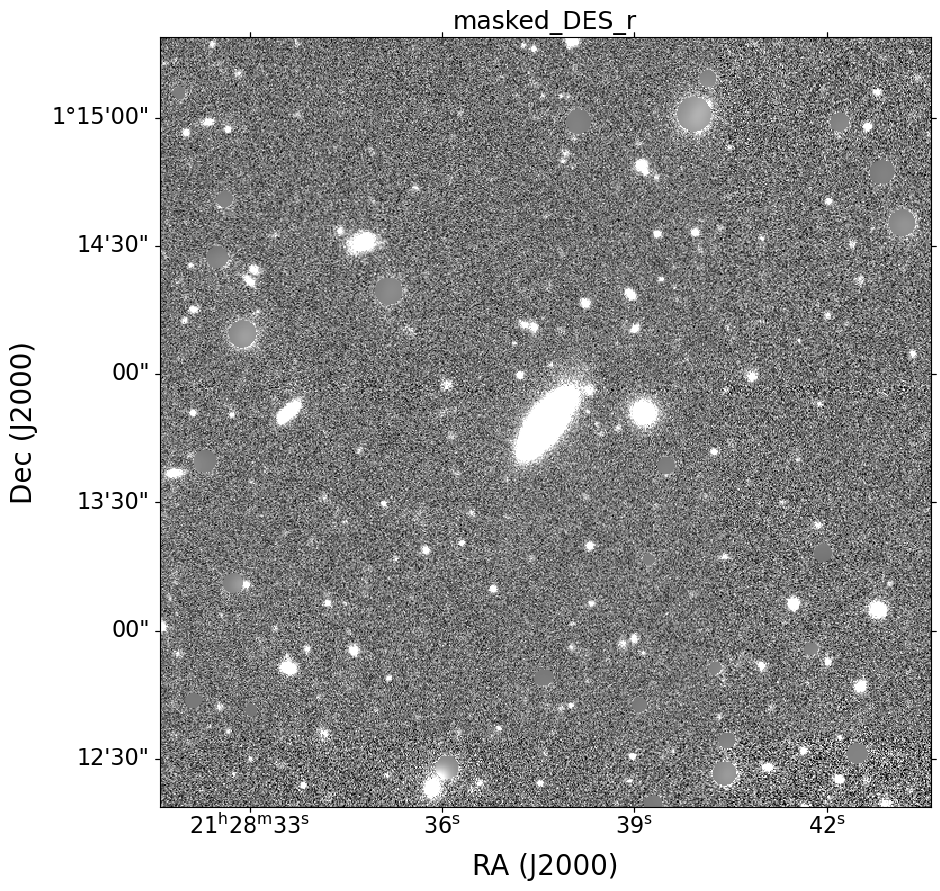

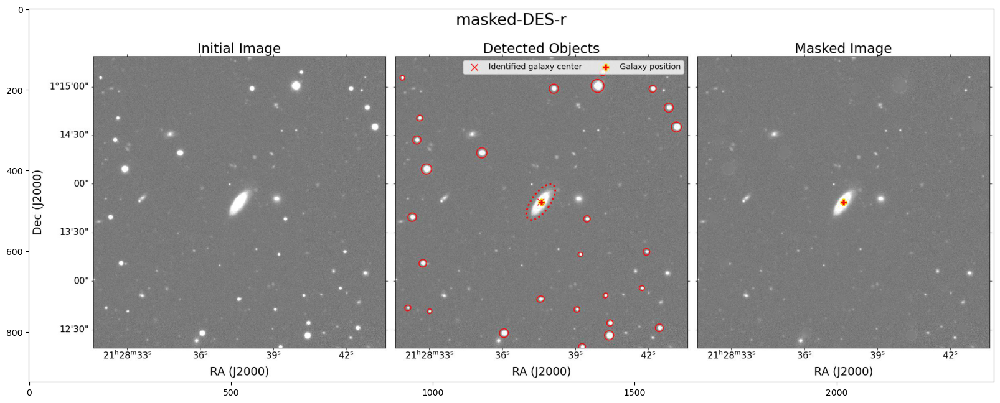

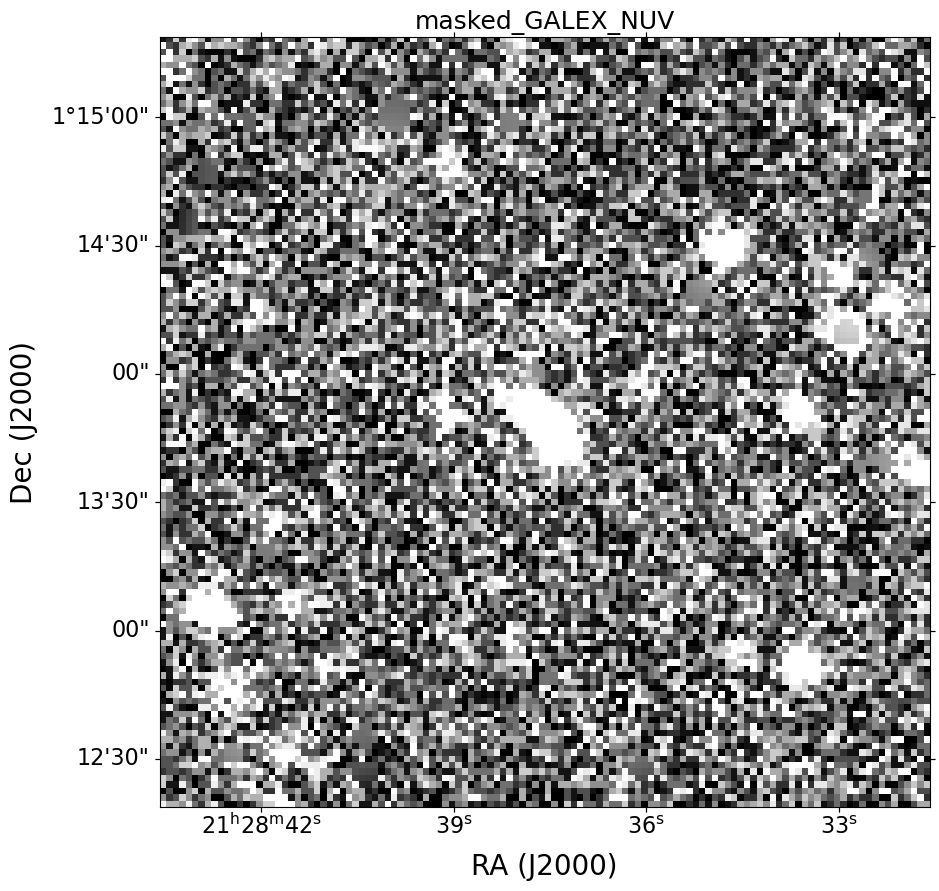

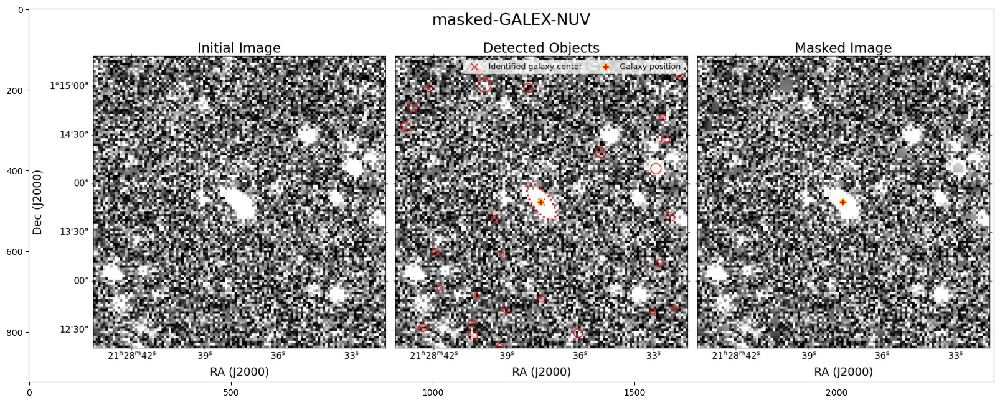

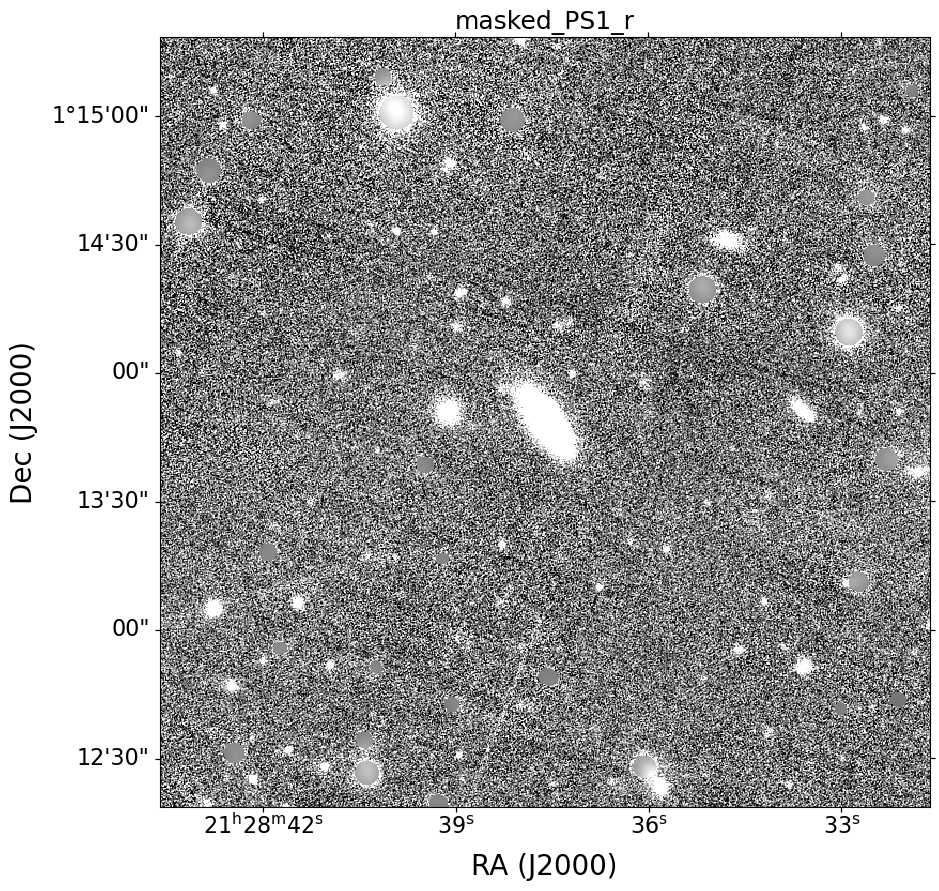

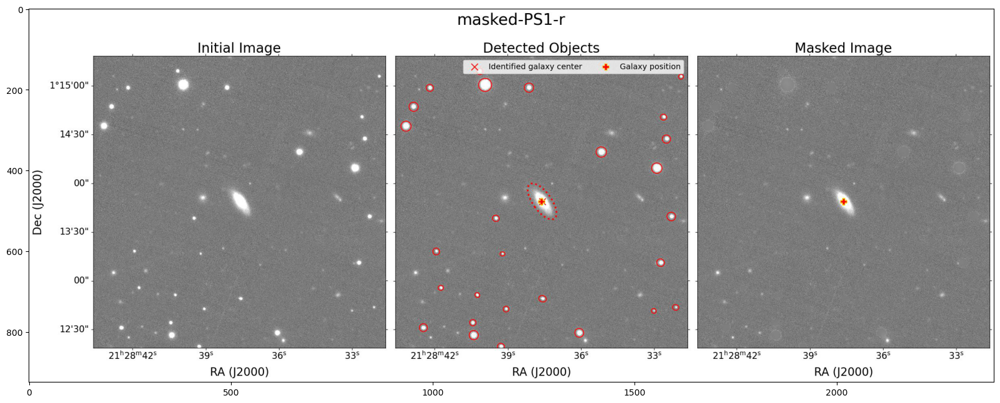

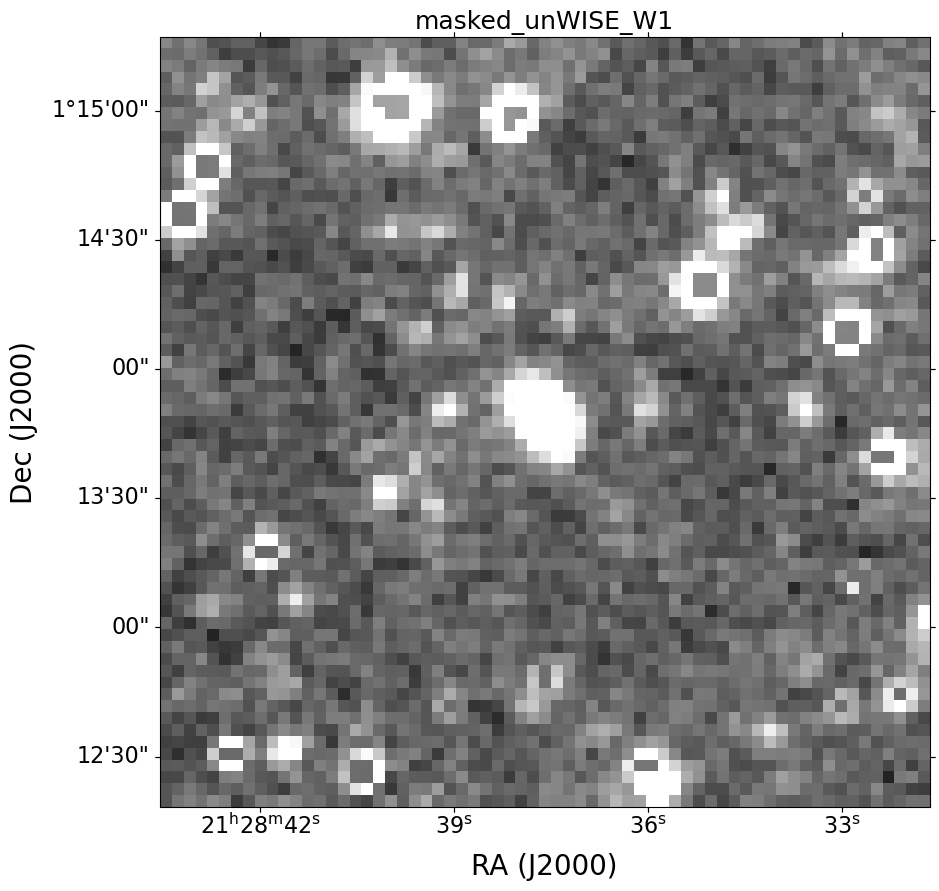

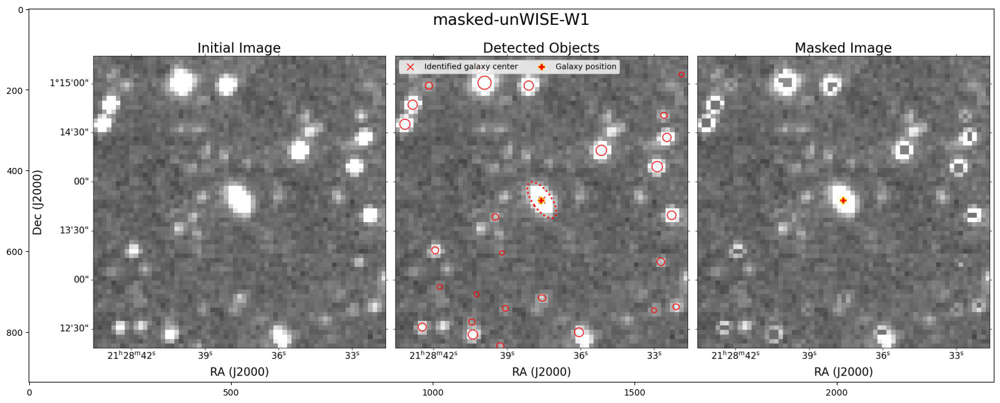

In [35]:
name = "2006eq"
masked_files = []
for survey in surveys:
    survey_files = glob.glob(f'images/{name}/masked_{survey}*')
    for file in survey_files:
        if survey in file and file.endswith('.fits'):
            masked_files.append(file)

masked_files = list(np.sort(masked_files))
for file in masked_files:
    if '_r.fits' in file or '_NUV.fits' in file or "_W1.fits" in file:
        plot_fits(file)

        jpg_file = file.replace('.fits', '.jpg')
        plt.figure(figsize=(20, 12))
        img = mpimg.imread(jpg_file)
        imgplot = plt.imshow(img)
        plt.show()

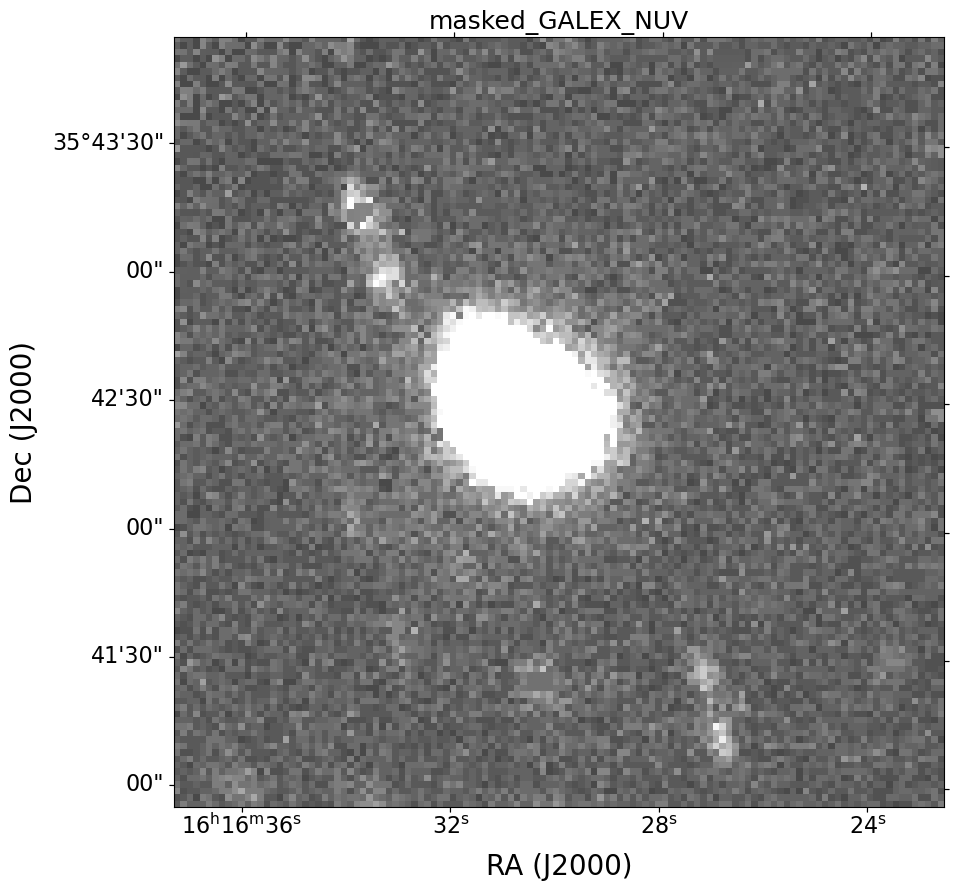

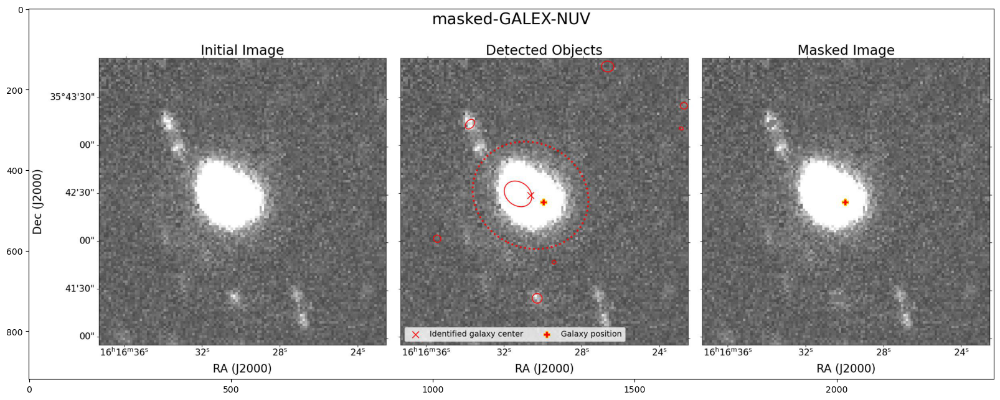

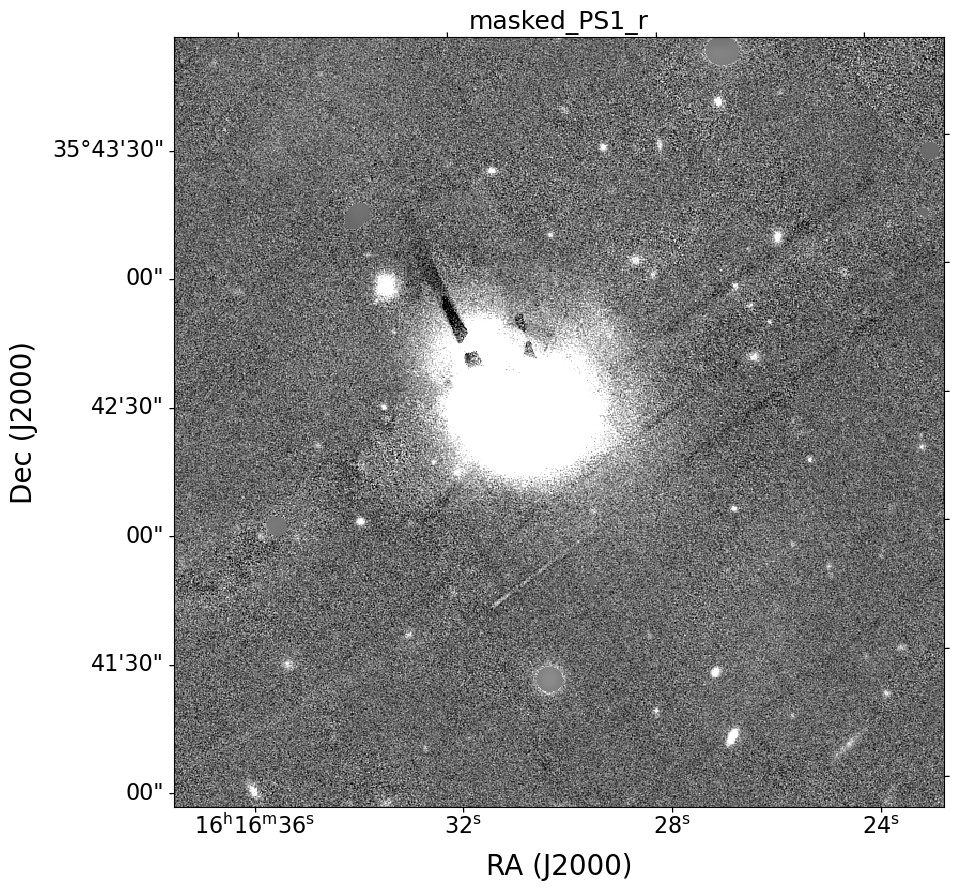

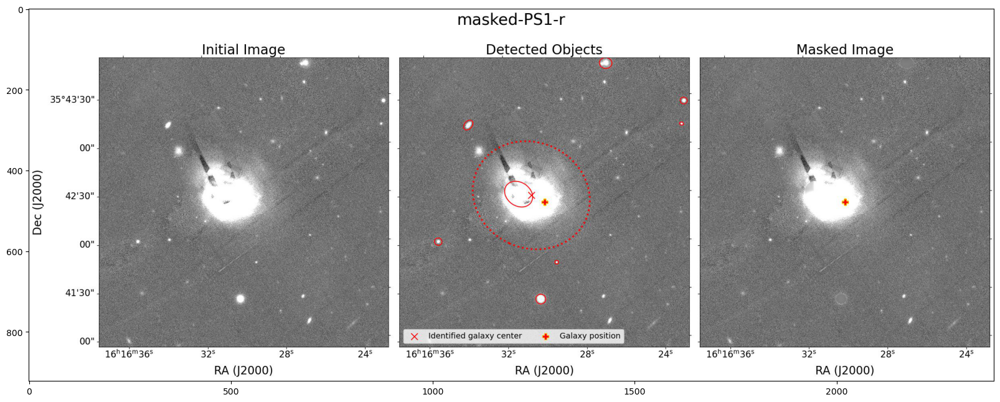

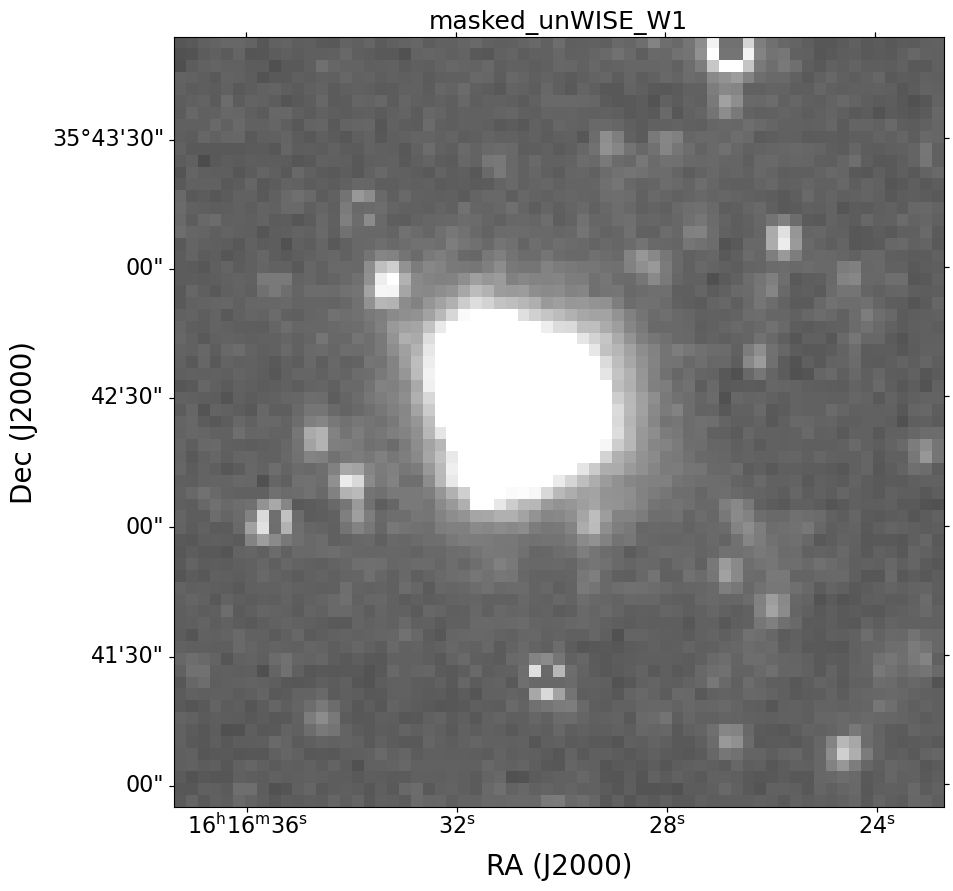

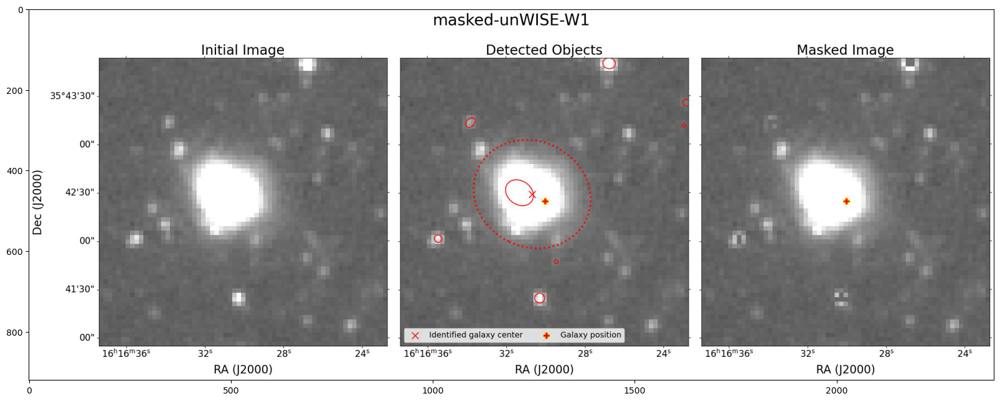

In [6]:
name = "2002de"
masked_files = []
for survey in surveys:
    survey_files = glob.glob(f'images/{name}/masked_{survey}*')
    for file in survey_files:
        if survey in file and file.endswith('.fits'):
            masked_files.append(file)

masked_files = list(np.sort(masked_files))
for file in masked_files:
    if '_r.fits' in file or '_NUV.fits' in file or "_W1.fits" in file:
        plot_fits(file)

        jpg_file = file.replace('.fits', '.jpg')
        plt.figure(figsize=(20, 12))
        img = mpimg.imread(jpg_file)
        imgplot = plt.imshow(img)
        plt.show()

### Different mask for every survey

In [12]:
for name, host_ra, host_dec in zip(lowz_df.CID, lowz_df.Host_RA, lowz_df.Host_DEC):
    for survey, coadd_filters in coadd_dict.items():
        filters = get_survey_filters(survey)
        if f"{survey}_{''.join(coadd_filters)}.fits" in os.listdir(f"images/{name}"):
            coadd_mask_params = create_mask(name, host_ra, host_dec,
                                        filt=coadd_filters,
                                        survey=survey,
                                        extract_params=True)
        else:
            coadd_mask_params = None
            print(f"No coadd {name}/{survey}_{''.join(coadd_filters)}.fits")
        for filt in filters:
            if f"{survey}_{filt}.fits" in os.listdir(f"images/{name}"):
                    try:
                        create_mask(name, host_ra, host_dec,
                                    filt, survey=survey,
                                    common_params=coadd_mask_params)
                    except Exception as e:
                         print(e)
                         print(f"While creating mask for {name}/{survey}_{filt}")
            else:
                print(f"Couldn't find {name}/{survey}_{filt}.fits")

No coadd 2006et/SDSS_riz.fits
Couldn't find 2006et/SDSS_u.fits
Couldn't find 2006et/SDSS_g.fits
Couldn't find 2006et/SDSS_r.fits
Couldn't find 2006et/SDSS_i.fits
Couldn't find 2006et/SDSS_z.fits
No coadd 2006ev/SDSS_riz.fits
Couldn't find 2006ev/SDSS_u.fits
Couldn't find 2006ev/SDSS_g.fits
Couldn't find 2006ev/SDSS_r.fits
Couldn't find 2006ev/SDSS_i.fits
Couldn't find 2006ev/SDSS_z.fits
No coadd 2005lu/SDSS_riz.fits
Couldn't find 2005lu/SDSS_u.fits
Couldn't find 2005lu/SDSS_g.fits
Couldn't find 2005lu/SDSS_r.fits
Couldn't find 2005lu/SDSS_i.fits
Couldn't find 2005lu/SDSS_z.fits
No coadd 2005iq/SDSS_riz.fits
Couldn't find 2005iq/SDSS_u.fits
Couldn't find 2005iq/SDSS_g.fits
Couldn't find 2005iq/SDSS_r.fits
Couldn't find 2005iq/SDSS_i.fits
Couldn't find 2005iq/SDSS_z.fits
No coadd 2006ax/SDSS_riz.fits
Couldn't find 2006ax/SDSS_u.fits
Couldn't find 2006ax/SDSS_g.fits
Couldn't find 2006ax/SDSS_r.fits
Couldn't find 2006ax/SDSS_i.fits
Couldn't find 2006ax/SDSS_z.fits
No coadd 2007ca/SDSS_riz.

In [13]:
notify()

In [13]:
for name, host_ra, host_dec in zip(lowz_df.CID, lowz_df.Host_RA, lowz_df.Host_DEC):
    for survey, coadd_filters in coadd_dict.items():
        if survey != "2MASS":
             continue
        filters = get_survey_filters(survey)
        if f"{survey}_{''.join(coadd_filters)}.fits" in os.listdir(f"images/{name}"):
            coadd_mask_params = create_mask(name, host_ra, host_dec,
                                        filt=coadd_filters,
                                        survey=survey,
                                        extract_params=True)
        else:
            coadd_mask_params = None
            print(f"No coadd {name}/{survey}_{''.join(coadd_filters)}.fits")
        for filt in filters:
            if f"{survey}_{filt}.fits" in os.listdir(f"images/{name}"):
                    try:
                        create_mask(name, host_ra, host_dec,
                                    filt, survey=survey,
                                    common_params=coadd_mask_params)
                    except Exception as e:
                         print(e)
                         print(f"While creating mask for {name}/{survey}_{filt}")
            else:
                print(f"Couldn't find {name}/{survey}_{filt}.fits")

'NoneType' object has no attribute 'copy'
While creating mask for 2008by/2MASS_J
'NoneType' object has no attribute 'copy'
While creating mask for 2008by/2MASS_H
'NoneType' object has no attribute 'copy'
While creating mask for 2008by/2MASS_Ks


In [24]:
for name, host_ra, host_dec in zip(lowz_df.CID, lowz_df.Host_RA, lowz_df.Host_DEC):
    for survey, coadd_filters in coadd_dict.items():
        if survey != "unWISE":
             continue
        filters = get_survey_filters(survey)
        if f"{survey}_{''.join(coadd_filters)}.fits" in os.listdir(f"images/{name}"):
            coadd_mask_params = create_mask(name, host_ra, host_dec,
                                        filt=coadd_filters,
                                        survey=survey,
                                        extract_params=True)
        else:
            coadd_mask_params = None
            print(f"No coadd {name}/{survey}_{''.join(coadd_filters)}.fits")
        for filt in filters:
            if f"{survey}_{filt}.fits" in os.listdir(f"images/{name}"):
                    try:
                        create_mask(name, host_ra, host_dec,
                                    filt, survey=survey,
                                    common_params=coadd_mask_params)
                    except Exception as e:
                         print(e)
                         print(f"While creating mask for {name}/{survey}_{filt}")
            else:
                print(f"Couldn't find {name}/{survey}_{filt}.fits")

'NoneType' object has no attribute 'copy'
While creating mask for 2003iv/unWISE_W1
'NoneType' object has no attribute 'copy'
While creating mask for 2003iv/unWISE_W2
'NoneType' object has no attribute 'copy'
While creating mask for 2003iv/unWISE_W3
'NoneType' object has no attribute 'copy'
While creating mask for 2003iv/unWISE_W4
'NoneType' object has no attribute 'copy'
While creating mask for 2007hu/unWISE_W1
'NoneType' object has no attribute 'copy'
While creating mask for 2007hu/unWISE_W2
'NoneType' object has no attribute 'copy'
While creating mask for 2007hu/unWISE_W3
'NoneType' object has no attribute 'copy'
While creating mask for 2007hu/unWISE_W4
'NoneType' object has no attribute 'copy'
While creating mask for 2008by/unWISE_W1
'NoneType' object has no attribute 'copy'
While creating mask for 2008by/unWISE_W2
'NoneType' object has no attribute 'copy'
While creating mask for 2008by/unWISE_W3
'NoneType' object has no attribute 'copy'
While creating mask for 2008by/unWISE_W4
'Non

In [25]:
notify()

Problems:
2001en
2001G GALEX
2001V PS1
2002bf GALEX
2002dp
2002hd GALEX
2002hu GALEX
2002kf
2003ai
2003fa
2003ic GALEX
2003iv unWISE
2003U
2004as
2004gu 2MASS
2005bo
2005eq GALEX
2005hc GALEX
2005hf GALEX
2005ki GALEX ??
2005lu       ??
2005M
2006ac GALEX
2006al
2006ax GALEX
2006cp unWISE, GALEX
2006ev
2006gr
2006hb unWISE ???
2006mo 2MASS ???
2006N GALEX
2006oa
2006ob GALEX
2006qo
2006sr GALEX, unWISE
2006td 2MASS
2007aj
2007fb GALEX
2007hu unWISE
2007is GALEX
2007kd 2MASS
2007kh
2007O
2007ob 2MASS
2007su       ???
2007sw
2008ac unWISE
2008bf PS1
2008by
2008cf       ???
2008fr
2008gb GALEX
2008gp GALEX
2008hj GALEX
2008hs GALEX
2008L GALEX
2008Z
2009D GALEX
2009ds GALEX
2009na unWISE
2009nq GALEX
2010H GALEX
2008050 2MASS ???


In [29]:
# Manually fix the incorrect maskings

def preprocess(sn_name, survey, threshold=15, sigma=8, r=6, crossmatch=False):
    sn_df = lowz_df[lowz_df.CID==sn_name]
    ra = sn_df.RA.values[0]
    dec = sn_df.DECL.values[0]
    host_ra = sn_df.Host_RA.values[0]
    host_dec = sn_df.Host_DEC.values[0]
    filters = get_survey_filters(survey)
    # mask coadd
    try:
        common_params = create_mask(sn_name, host_ra, host_dec, 
                                              coadd_dict[survey], survey=survey,
                                              ra=ra, dec=dec,
                                              threshold=threshold, sigma=sigma,
                                              extract_params=True, crossmatch=crossmatch)
    except Exception as e:
        common_params = None
        print(f'No coadd {name}/{survey}_{"".join(coadd_filters)}.fits')
    print("After")
    # use coadd parameters to mask the other images
    for filt in filters:
        try:
            create_mask(sn_name, host_ra, host_dec, filt, 
                                  ra=ra, dec=dec, sigma=sigma, r=r,
                                  survey=survey, common_params=common_params)
        except Exception as e:
            print(e)
            print(f"While creating mask for {name}/{survey}_{filt}")

In [30]:
def preprocess_from_other(sn_name, survey, survey_from, sigma=8, r=6):
    filts_mask = ''.join(coadd_dict[survey_from])
    with open(f"images/{sn_name}/{survey_from}_{filts_mask}_mask_parameters.pickle", "rb") as f:
        coadd_mask_params = pickle.load(f)
    print('Loaded')
    sn_df = lowz_df[lowz_df.CID==sn_name]
    ra = sn_df.RA.values[0]
    dec = sn_df.DECL.values[0]
    host_ra = sn_df.Host_RA.values[0]
    host_dec = sn_df.Host_DEC.values[0]
    filters = get_survey_filters(survey)
    print("After")
    # use coadd parameters to mask the other images
    for filt in filters:
        try:
            create_mask(sn_name, host_ra, host_dec, filt, 
                        ra=ra, dec=dec, sigma=sigma, r=r,
                        survey=survey, common_params=coadd_mask_params)
        except Exception as e:
            print(e)
            print(f"While creating mask for {name}/{survey}_{filt}")

In [91]:
for sn_dirname in os.listdir('images'):
    try:
        preprocess_from_other(sn_dirname, 'SDSS', 'PS1', 8, 6)
    except Exception as e:
        print(e)
        print(f'While processing {sn_dirname}')

Loaded
After
Loaded
After
Loaded
After
Loaded
After
Loaded
After
Loaded
After
Loaded
After
Loaded
After
Loaded
After
Loaded
After
Loaded
After
Loaded
After
Loaded
After
Loaded
After
[Errno 2] No such file or directory: 'images\\2002hd\\SDSS_u.fits'
While creating mask for 2008gp/SDSS_u
[Errno 2] No such file or directory: 'images\\2002hd\\SDSS_g.fits'
While creating mask for 2008gp/SDSS_g
[Errno 2] No such file or directory: 'images\\2002hd\\SDSS_r.fits'
While creating mask for 2008gp/SDSS_r
[Errno 2] No such file or directory: 'images\\2002hd\\SDSS_i.fits'
While creating mask for 2008gp/SDSS_i
[Errno 2] No such file or directory: 'images\\2002hd\\SDSS_z.fits'
While creating mask for 2008gp/SDSS_z
Loaded
After
[Errno 2] No such file or directory: 'images\\2002he\\SDSS_u.fits'
While creating mask for 2008gp/SDSS_u
[Errno 2] No such file or directory: 'images\\2002he\\SDSS_g.fits'
While creating mask for 2008gp/SDSS_g
[Errno 2] No such file or directory: 'images\\2002he\\SDSS_r.fits'
Whi

In [18]:
sn_name = '2001ah'
survey = 'PS1'
threshold = 8
sigma = 8
r=6
crossmatch = False
preprocess(sn_name, survey, threshold, sigma, r, crossmatch)

After


In [19]:
sn_name = '2001ah'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r=6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [20]:
sn_name = '2001ah'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 8
r=6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [26]:
sn_name = '2001ah'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 8
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [27]:
sn_name = '2001az'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [31]:
sn_name = '2001az'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After
[Errno 2] No such file or directory: 'images\\2001az\\GALEX_NUV.fits'
While creating mask for 2008gp/GALEX_NUV


In [36]:
sn_name = '2001az'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 14
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [18]:
preprocess("2001en", "PS1", 200, 6, False)

Before
After


In [25]:
preprocess("2001en", "2MASS", 70, 2, False)

After


In [38]:
sn_name = '2001en'
survey = '2MASS'
survey_from = 'PS1'
sigma = 2
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [36]:
preprocess("2001en", "GALEX", 50, 2, False)

After


In [39]:
sn_name = '2001en'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 2
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [40]:
sn_name = '2001en'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [41]:
preprocess("2001en", "unWISE", 100, 2, False)

After


In [41]:
sn_name = '2001en'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 2
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [42]:
sn_name = '2001fe'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [44]:
sn_name = '2001fe'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 4
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [45]:
sn_name = '2001G'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [50]:
preprocess("2001G", "GALEX", 6, 2, False)

After


In [48]:
sn_name = '2001G'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 2
r = 8
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [49]:
sn_name = '2001G'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 8
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [56]:
preprocess("2001V", "PS1", 8, 6, True)

After


In [50]:
sn_name = '2001V'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [57]:
preprocess("2001V", "GALEX", 8, 6, True)

After


In [51]:
sn_name = '2001V'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [52]:
sn_name = '2001V'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [55]:
sn_name = '2001V'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 2
r = 9
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [56]:
sn_name = '2002bf'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [61]:
preprocess("2002bf", "GALEX", 15, 6, True)

After


In [57]:
sn_name = '2002bf'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [58]:
sn_name = '2002bf'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [64]:
preprocess("2002bf", "unWISE", 6, 6, False)

After


In [61]:
sn_name = '2002bf'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 9
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [62]:
sn_name = '2002bz'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [66]:
sn_name = '2002bz'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 12
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [67]:
sn_name = '2002ck'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [68]:
sn_name = '2002ck'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [69]:
sn_name = '2002ck'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [71]:
sn_name = '2002de'
survey = 'PS1'
threshold = 150
sigma = 6
r = 6
crossmatch = True
preprocess(sn_name, survey, threshold, sigma, r, crossmatch)

After


In [72]:
sn_name = '2002de'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [73]:
sn_name = '2002de'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [74]:
sn_name = '2002de'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [72]:
preprocess("2002dp", "PS1", 120, 6, True)

After


In [74]:
preprocess("2002dp", "GALEX", 30, 6, True)

After


In [76]:
sn_name = '2002dp'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [75]:
preprocess("2002dp", "unWISE", 15, 6, True)

After


In [79]:
sn_name = '2002G'
survey = 'SDSS'
threshold = 6
sigma = 8
r = 6
crossmatch = False
preprocess(sn_name, survey, threshold, sigma, r, crossmatch)

After


In [80]:
sn_name = '2002ha'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [81]:
sn_name = '2002ha'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [82]:
sn_name = '2002ha'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [84]:
sn_name = '2002ha'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 4
r = 8
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [78]:
preprocess("2002hd", "2MASS", 15, 6, True)

After


In [85]:
sn_name = '2002hd'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [87]:
preprocess("2002hd", "GALEX", 8, 8, True)

After


In [88]:
sn_name = '2002hd'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [95]:
sn_name = '2002hd'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 4
r = 8
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [97]:
sn_name = '2002he'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [87]:
preprocess("2002hu", "GALEX", 4, 6, True)

After


In [94]:
sn_name = '2002hu'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [100]:
preprocess("2002jy", "PS1", 22, 6, 6, True)

After


In [102]:
sn_name = '2002jy'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [103]:
sn_name = '2002jy'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [104]:
sn_name = '2002jy'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [107]:
sn_name = '2002jy'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 4
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [88]:
preprocess("2002kf", "2MASS", 10, 6, False)

After


In [89]:
preprocess("2002kf", "GALEX", 15, 6, True)

After


In [108]:
sn_name = '2002kf'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [111]:
sn_name = '2002kf'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [95]:
preprocess("2003ai", "PS1", 8, 6, False)

After


In [93]:
preprocess("2003ai", "2MASS", 6, 6, False)

After


In [112]:
sn_name = '2003ai'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [113]:
sn_name = '2003ai'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [117]:
sn_name = '2003ai'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 12
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [118]:
sn_name = '2003ch'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [121]:
sn_name = '2003ch'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 14
r = 8
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [123]:
sn_name = '2003ch'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 8
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [96]:
preprocess("2003fa", "PS1", 150, 6, False)

After


In [100]:
preprocess("2003fa", "GALEX", 20, 6, False)

After


In [124]:
sn_name = '2003fa'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [125]:
sn_name = '2003fa'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [134]:
preprocess('2003ic', 'PS1', 12, 10, 6, False)

After


In [126]:
sn_name = '2003ic'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [107]:
preprocess("2003ic", "GALEX", 20, 4, True)

After


In [127]:
sn_name = '2003ic'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [130]:
sn_name = '2003ic'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 4
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [135]:
sn_name = '2003it'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [137]:
sn_name = '2003it'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 8
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [138]:
sn_name = '2003iv'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [114]:
preprocess("2003U", "GALEX", 15, 4, True)

After


In [116]:
preprocess("2003U", "2MASS", 7, 6, False)

After


In [143]:
preprocess("2003U", "unWISE", 60, 3, 6, False)

After


Loaded
After


KeyboardInterrupt: 

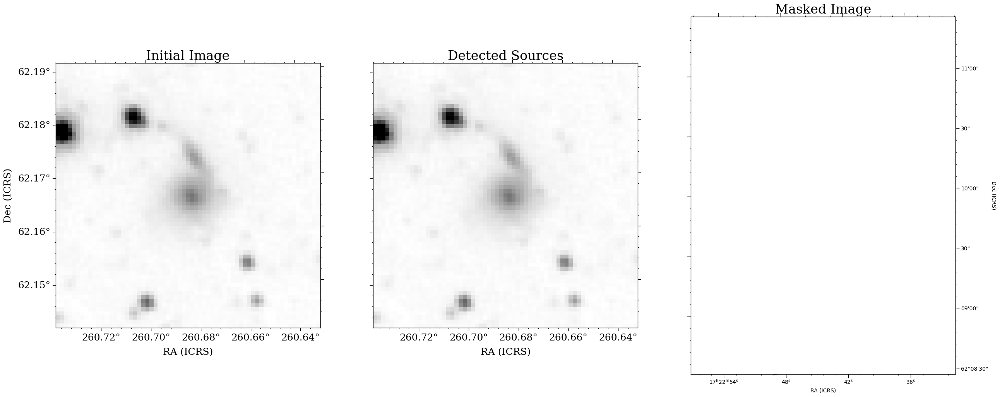

In [141]:
sn_name = '2003U'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 3
r = 12
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

In [124]:
preprocess("2004as", "2MASS", 4, 6, False)

After


In [129]:
preprocess("2004as", "GALEX", 10, 6, False)

After


In [130]:
preprocess("2004as", "PS1", 15, 6, True)

After


In [132]:
preprocess("2004as", "unWISE", 7, 6, False)

After


In [144]:
sn_name = '2004ef'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [147]:
sn_name = '2004ef'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [146]:
sn_name = '2004ef'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [148]:
sn_name = '2004eo'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [149]:
sn_name = '2004eo'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [152]:
sn_name = '2004eo'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 3
r = 9
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [153]:
sn_name = '2004ey'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [154]:
sn_name = '2004ey'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [157]:
sn_name = '2004ey'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [133]:
preprocess("2004gu", "2MASS", 10, 6, False)

After


In [137]:
preprocess("2004gu", "GALEX", 5, 8, False)

After


In [161]:
preprocess("2004gu", "SDSS", 3, 8, 6, False)

After


In [164]:
sn_name = '2004gu'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 14
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [166]:
sn_name = '2005be'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [168]:
sn_name = '2005be'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [139]:
preprocess("2005bo", "2MASS", 20, 6, True)

After


In [169]:
sn_name = '2005bo'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [138]:
preprocess("2005bo", "GALEX", 15, 6, True)

After


In [ ]:
sn_name = '2005bo'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

In [140]:
preprocess("2005bo", "PS1", 20, 6, True)

After


In [144]:
preprocess("2005bo", "unWISE", 20, 4, False)

After


In [171]:
sn_name = '2005bo'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 2
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [172]:
preprocess("2005eq", "PS1", 10, 8, 6, False)

After


In [173]:
sn_name = '2005eq'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [149]:
preprocess("2005eq", "GALEX", 10, 6, True)

After


In [174]:
sn_name = '2005eq'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [175]:
sn_name = '2005eq'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [176]:
sn_name = '2005eq'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [177]:
preprocess("2005hc", "PS1", 10, 8, 6, False)

After


In [178]:
sn_name = '2005hc'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [150]:
preprocess("2005hc", "GALEX", 15, 6, True)

After


In [182]:
sn_name = '2005hc'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [180]:
sn_name = '2005hc'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [181]:
sn_name = '2005hc'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [ ]:
preprocess("2005hf", "GALEX", 10, 6, True)

After


In [184]:
sn_name = '2005hf'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 12
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [185]:
preprocess("2005iq", "PS1", 10, 8, 6, False)

After


In [186]:
sn_name = '2005iq'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [187]:
sn_name = '2005iq'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [189]:
sn_name = '2005iq'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 4
r = 12
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [190]:
sn_name = '2005ki'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [192]:
sn_name = '2005ki'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 8
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [153]:
preprocess("2005lu", "DES", 40, 14, False)

After


In [158]:
preprocess("2005lu", "2MASS", 13, 14, False)

After


In [193]:
sn_name = '2005lu'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [161]:
preprocess("2005lu", "PS1", 40, 14, False)

After


In [195]:
sn_name = '2005lu'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 3
r = 8
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [197]:
sn_name = '2005lu'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [200]:
sn_name = '2005lz'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 12
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [164]:
preprocess("2005M", "GALEX", 40, 6, True)

After


In [173]:
preprocess("2005M", "PS1", 120, 6, 6, True)

After


In [201]:
sn_name = '2005ms'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [204]:
sn_name = '2005ms'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 3
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [205]:
preprocess("2006ac", "PS1", 5, 6, 6, False)

After


In [206]:
sn_name = '2006ac'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [174]:
preprocess("2006ac", "GALEX", 15, 6, True)

After


In [207]:
sn_name = '2006ac'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [208]:
sn_name = '2006ac'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [209]:
sn_name = '2006ac'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 2
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [ ]:
sn_name = '2006ak'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

In [211]:
preprocess("2006al", "PS1", 8, 8, 6, False)

After


In [175]:
preprocess("2006al", "2MASS", 10, 6, True)

After


In [212]:
sn_name = '2006al'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [180]:
preprocess("2006al", "GALEX", 4, 6, False)

After


In [213]:
sn_name = '2006al'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [214]:
sn_name = '2006al'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [215]:
sn_name = '2006al'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 4
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [218]:
preprocess("2006ax", "PS1", 40, 4, 6, False)

After


In [184]:
preprocess("2006ax", "GALEX", 5, 8, True)

After


In [219]:
sn_name = '2006ax'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [221]:
sn_name = '2006ax'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 3
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [226]:
preprocess("2006bh", "unWISE", 8, 3, 6, False)

After


In [227]:
sn_name = '2006cp'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [189]:
preprocess("2006cp", "unWISE", 17, 4, True)

After


In [228]:
sn_name = '2006cp'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 3
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [229]:
sn_name = '2006cq'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [230]:
sn_name = '2006cq'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [231]:
sn_name = '2006ef'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [232]:
sn_name = '2006ef'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [234]:
sn_name = '2006ef'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 4
r = 8
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [235]:
sn_name = '2006eq'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [236]:
sn_name = '2006eq'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [238]:
sn_name = '2006eq'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 12
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [190]:
preprocess("2006ev", "PS1", 50, 5, False)

After


In [239]:
sn_name = '2006ev'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [194]:
preprocess("2006ev", "GALEX", 4, 5, True)

After


In [240]:
sn_name = '2006ev'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [242]:
sn_name = '2006ev'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 3
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [245]:
preprocess("2006gr", "PS1", 279, 4, 6, False)

After


In [ ]:
preprocess("2006gr", "PS1", 279, 4, False)

In [246]:
sn_name = '2006hb'
survey = '2MASS'
survey_from = 'DES'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [11]:
preprocess("2006hb", "GALEX", 6, 4, False)

After


Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "c:\ProgramData\Anaconda3\envs\tfgpiscola\lib\asyncio\events.py", line 80, in _run
    self._context.run(self._callback, *self._args)
  File "c:\ProgramData\Anaconda3\envs\tfgpiscola\lib\asyncio\selector_events.py", line 115, in _read_from_self
    data = self._ssock.recv(4096)
ConnectionResetError: [WinError 10054] Se ha forzado la interrupción de una conexión existente por el host remoto
Exception in callback BaseSelectorEventLoop._read_from_self()
handle: <Handle BaseSelectorEventLoop._read_from_self()>
Traceback (most recent call last):
  File "c:\ProgramData\Anaconda3\envs\tfgpiscola\lib\asyncio\events.py", line 80, in _run
    self._context.run(self._callback, *self._args)
  File "c:\ProgramData\Anaconda3\envs\tfgpiscola\lib\asyncio\selector_events.py", line 115, in _read_from_self
    data = self._ssock.recv(4096)
Connec

In [249]:
sn_name = '2006hb'
survey = 'GALEX'
survey_from = 'DES'
sigma = 4
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [209]:
preprocess("2006hb", "unWISE", 6, 4, False)

After


In [248]:
sn_name = '2006hb'
survey = 'unWISE'
survey_from = 'DES'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [250]:
sn_name = '2006lu'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [252]:
sn_name = '2006lu'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 8
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [253]:
sn_name = '2006lu'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [254]:
sn_name = '2006mo'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [213]:
preprocess("2006mo", "GALEX", 6, 8, True)

After


In [255]:
sn_name = '2006mo'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [217]:
preprocess("2006mo", "unWISE", 4, 4, False)

After


In [258]:
sn_name = '2006mo'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 4
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [259]:
sn_name = '2006mp'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [260]:
sn_name = '2006mp'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [262]:
sn_name = '2006mp'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 3
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [264]:
sn_name = '2006N'
survey = '2MASS'
survey_from = 'PS1'
sigma = 4
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [218]:
preprocess("2006N", "GALEX", 10, 6, False)

After


In [268]:
sn_name = '2006N'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 4
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [228]:
preprocess("2006N", "unWISE", 20, 2, False)

After


In [266]:
sn_name = '2006N'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [269]:
sn_name = '2006oa'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [230]:
preprocess("2006oa", "GALEX", 8, 6, False)

After


In [232]:
preprocess("2006oa", "PS1", 7, 6, False)

After


In [237]:
preprocess("2006oa", "unWISE", 4, 6, False)

After


In [271]:
sn_name = '2006oa'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [272]:
sn_name = '2006ob'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [243]:
preprocess("2006ob", "GALEX", 10, 6, True)

After


In [273]:
sn_name = '2006ob'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [274]:
sn_name = '2006ob'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 3
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [275]:
sn_name = '2006on'
survey = '2MASS'
survey_from = 'DES'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [276]:
sn_name = '2006on'
survey = 'GALEX'
survey_from = 'DES'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [278]:
sn_name = '2006on'
survey = 'unWISE'
survey_from = 'DES'
sigma = 3
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [279]:
sn_name = '2006py'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [280]:
sn_name = '2006py'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 3
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [244]:
preprocess("2006qo", "2MASS", 10, 6, False)

After


In [281]:
sn_name = '2006qo'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [248]:
preprocess("2006qo", "PS1", 7, 8, False)

After


In [252]:
preprocess("2006qo", "unWISE", 40, 4, False)

After


In [283]:
sn_name = '2006qo'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [284]:
sn_name = '2006sr'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [253]:
preprocess("2006sr", "GALEX", 15, 8, True)

After


In [285]:
sn_name = '2006sr'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [256]:
preprocess("2006sr", "unWISE", 40, 5, False)

After


In [286]:
sn_name = '2006sr'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 3
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [257]:
preprocess("2006td", "2MASS", 10, 8, False)

After


In [287]:
sn_name = '2006td'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [288]:
sn_name = '2006te'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [289]:
sn_name = '2006te'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [290]:
sn_name = '2006te'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 4
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [291]:
sn_name = '2007A'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [294]:
sn_name = '2007A'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 8
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [293]:
sn_name = '2007A'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 3
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [295]:
sn_name = '2007aj'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [261]:
preprocess("2007aj", "GALEX", 4, 8, False)

After


In [263]:
preprocess("2007aj", "PS1", 8, 8, False)

After


In [264]:
preprocess("2007aj", "unWISE", 6, 8, False)

After


In [296]:
sn_name = '2007aj'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [297]:
sn_name = '2007ap'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [298]:
sn_name = '2007ap'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [299]:
sn_name = '2007ca'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [300]:
sn_name = '2007ca'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [301]:
preprocess("2007co", "PS1", 28, 6, 6, False)

After


In [302]:
sn_name = '2007co'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [305]:
sn_name = '2007co'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 2
r = 8
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [306]:
preprocess("2007F", "PS1", 8, 8, 6, False)

After


In [307]:
sn_name = '2007F'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [308]:
sn_name = '2007F'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [309]:
sn_name = '2007F'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [311]:
sn_name = '2007F'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 8
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [270]:
preprocess("2007fb", "GALEX", 6, 12, True)

After


In [276]:
preprocess("2007hu", "GALEX", 6, 6, False)

After


In [ ]:
preprocess("2007hu", "unWISE", 8, 6, False)

After


In [312]:
sn_name = '2007is'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [277]:
preprocess("2007is", "GALEX", 30, 6, False)

After


In [313]:
sn_name = '2007is'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [315]:
sn_name = '2007is'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 2
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [281]:
preprocess("2007kd", "2MASS", 6, 6, False)

After


In [316]:
sn_name = '2007kd'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [282]:
preprocess("2007kh", "PS1", 4, 6, False)

After


In [283]:
preprocess("2007kh", "2MASS", 2, 6, False)

After


In [317]:
sn_name = '2007kh'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [284]:
preprocess("2007kh", "unWISE", 2, 6, False)

After


In [319]:
sn_name = '2007kh'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [320]:
sn_name = '2007kk'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [321]:
sn_name = '2007kk'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [322]:
sn_name = '2007kk'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [323]:
preprocess("2007nq", "PS1", 8, 6, 6, False)

After


In [324]:
sn_name = '2007nq'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [325]:
sn_name = '2007nq'
survey = 'DES'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [326]:
sn_name = '2007nq'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [327]:
sn_name = '2007nq'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [328]:
sn_name = '2007nq'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [329]:
sn_name = '2007O'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [285]:
preprocess("2007O", "GALEX", 15, 6, True)

After


In [286]:
preprocess("2007O", "PS1", 20, 6, False)

After


In [330]:
sn_name = '2007O'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 4
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [331]:
preprocess('2007ob', 'PS1', 8, 6, 6, False)

After


In [292]:
preprocess("2007ob", "2MASS", 10, 6, True)

After


In [332]:
sn_name = '2007ob'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [291]:
preprocess("2007ob", "GALEX", 4, 6, False)

After


In [333]:
sn_name = '2007ob'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [ ]:
sn_name = '2007ob'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

In [334]:
sn_name = '2007ob'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [335]:
sn_name = '2007R'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [336]:
sn_name = '2007R'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [337]:
sn_name = '2007R'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 3
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [296]:
preprocess("2007su", "PS1", 100, 6, False)

After


In [338]:
sn_name = '2007su'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [299]:
preprocess("2007su", "GALEX", 6, 6, False)

After


In [340]:
sn_name = '2007su'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 4
r = 12
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [342]:
preprocess("2007sw", "PS1", 12, 8, 6, False)

After


In [343]:
sn_name = '2007sw'
survey = '2MASS'
survey_from = 'PS1'
sigma = 4
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [302]:
preprocess("2007sw", "GALEX", 70, 6, False)

After


In [344]:
sn_name = '2007sw'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 4
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [306]:
preprocess("2007sw", "unWISE", 70, 4, False)

After


In [346]:
sn_name = '2007sw'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 2
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [347]:
preprocess("2008ac", "PS1", 4, 6, 6, False)

After


In [309]:
preprocess("2008ac", "2MASS", 3, 6, False)

After


In [348]:
sn_name = '2008ac'
survey = '2MASS'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [349]:
sn_name = '2008ac'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [350]:
sn_name = '2008ac'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [311]:
preprocess("2008ac", "unWISE", 7, 6, False)

After


In [351]:
sn_name = '2008ac'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 3
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [358]:
preprocess("2008af", "PS1", 13, 6, 6, False)

After


In [359]:
sn_name = '2008af'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [360]:
sn_name = '2008af'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [361]:
sn_name = '2008af'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [362]:
preprocess("2008ar", "PS1", 10, 6, 6, False)

After


In [363]:
sn_name = '2008ar'
survey = '2MASS'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [364]:
sn_name = '2008ar'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [365]:
sn_name = '2008ar'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [366]:
sn_name = '2008ar'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 3
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [369]:
preprocess("2008at", "PS1", 11, 6, 6, False)

After


In [370]:
sn_name = '2008at'
survey = '2MASS'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [371]:
sn_name = '2008at'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [372]:
sn_name = '2008at'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 4
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [313]:
preprocess("2008bf", "GALEX", 10, 10, False)

After


In [315]:
preprocess("2008bf", "unWISE", 60, 10, False)

After


In [373]:
preprocess("2008bq", "unWISE", 5, 6, 6, False)

After


In [318]:
preprocess("2008by", "GALEX", 4, 6, False)

After


In [378]:
preprocess("2008by", "PS1", 7, 6, 6, False)

After


In [323]:
preprocess("2008by", "unWISE", 3, 6, False)

After


In [375]:
sn_name = '2008by'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 4
r = 13
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [324]:
preprocess("2008cf", "PS1", 8, 6, False)

After


In [379]:
sn_name = '2008cf'
survey = '2MASS'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [330]:
preprocess("2008cf", "GALEX", 6, 6, False)

After


In [380]:
sn_name = '2008cf'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [381]:
sn_name = '2008cf'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 6
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After
index 0 is out of bounds for axis 0 with size 0
While creating mask for 2008gp/unWISE_W1
index 0 is out of bounds for axis 0 with size 0
While creating mask for 2008gp/unWISE_W2
index 0 is out of bounds for axis 0 with size 0
While creating mask for 2008gp/unWISE_W3
index 0 is out of bounds for axis 0 with size 0
While creating mask for 2008gp/unWISE_W4


IndexError: index 0 is out of bounds for axis 0 with size 0

<Figure size 3000x1200 with 3 Axes>

IndexError: index 0 is out of bounds for axis 0 with size 0

<Figure size 3000x1200 with 3 Axes>

IndexError: index 0 is out of bounds for axis 0 with size 0

<Figure size 3000x1200 with 3 Axes>

IndexError: index 0 is out of bounds for axis 0 with size 0

<Figure size 3000x1200 with 3 Axes>

In [331]:
preprocess("2008fr", "PS1", 4, 6, False)

After


In [382]:
sn_name = '2008fr'
survey = '2MASS'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [332]:
preprocess("2008fr", "GALEX", 6, 6, False)

After


In [336]:
preprocess("2008fr", "unWISE", 4, 6, False)

After


In [383]:
sn_name = '2008fr'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 6
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [384]:
sn_name = '2008gb'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [387]:
sn_name = '2008gb'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After
[Errno 2] No such file or directory: 'images\\2008gb\\GALEX_NUV.fits'
While creating mask for 2008gp/GALEX_NUV


In [386]:
sn_name = '2008gb'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [388]:
preprocess("2008gl", "PS1", 10, 6, 6, False)

After


In [389]:
preprocess("2008gl", "DES", 10, 6, 6, False)

After


In [390]:
sn_name = '2008gl'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [391]:
sn_name = '2008gl'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [392]:
sn_name = '2008gl'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 3
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [337]:
preprocess("2008gp", "PS1", 20, 6, False)

After


In [393]:
sn_name = '2008gp'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [342]:
preprocess("2008gp", "unWISE", 10, 6, False)

After


In [394]:
sn_name = '2008gp'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [343]:
preprocess("2008hj", "2MASS", 10, 6, False)

After


In [395]:
sn_name = '2008hj'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [347]:
preprocess("2008hj", "GALEX", 30, 6, False)

After


In [397]:
sn_name = '2008hj'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 4
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [398]:
sn_name = '2008hj'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 4
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [349]:
preprocess("2008hs", "PS1", 120, 8, False)

After


In [399]:
sn_name = '2008hs'
survey = '2MASS'
survey_from = 'PS1'
sigma = 4
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [400]:
sn_name = '2008hs'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 4
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [401]:
sn_name = '2008hs'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 4
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [403]:
sn_name = '2008hv'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 4
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [404]:
sn_name = '2008L'
survey = '2MASS'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [353]:
preprocess("2008L", "GALEX", 6, 6, False)

After


In [405]:
sn_name = '2008L'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [357]:
preprocess("2008L", "unWISE", 10, 6, False)

After


In [408]:
sn_name = '2008L'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 8
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [409]:
sn_name = '2008Y'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [410]:
sn_name = '2008Y'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [412]:
sn_name = '2008Y'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 6
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [413]:
sn_name = '2008Z'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [415]:
sn_name = '2008Z'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 12
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [416]:
sn_name = '2009ad'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [417]:
sn_name = '2009ad'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [361]:
preprocess("2009D", "GALEX", 25, 6, False)

After


In [418]:
preprocess("2009ds", "PS1", 11, 6, 6, False)

After


In [419]:
sn_name = '2009ds'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [363]:
preprocess("2009ds", "GALEX", 5, 6, True)

After


In [420]:
sn_name = '2009ds'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [421]:
sn_name = '2009ds'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [422]:
sn_name = '2009fv'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [423]:
sn_name = '2009fv'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [425]:
sn_name = '2009fv'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 4
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [426]:
sn_name = '2009kq'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [427]:
sn_name = '2009kq'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 4
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [429]:
sn_name = '2009kq'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 3
r = 8
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [430]:
preprocess("2009le", "PS1", 25, 6, 6, True)

After


In [431]:
sn_name = '2009le'
survey = '2MASS'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [432]:
sn_name = '2009le'
survey = 'DES'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [433]:
sn_name = '2009le'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After
[Errno 2] No such file or directory: 'images\\2009le\\SDSS_u.fits'
While creating mask for 2008gp/SDSS_u
[Errno 2] No such file or directory: 'images\\2009le\\SDSS_g.fits'
While creating mask for 2008gp/SDSS_g
[Errno 2] No such file or directory: 'images\\2009le\\SDSS_r.fits'
While creating mask for 2008gp/SDSS_r
[Errno 2] No such file or directory: 'images\\2009le\\SDSS_i.fits'
While creating mask for 2008gp/SDSS_i
[Errno 2] No such file or directory: 'images\\2009le\\SDSS_z.fits'
While creating mask for 2008gp/SDSS_z


In [434]:
sn_name = '2009le'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [435]:
sn_name = '2009nq'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [368]:
preprocess("2009nq", "GALEX", 100, 6, True)

After


In [436]:
sn_name = '2009nq'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [439]:
sn_name = '2009nq'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 6
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [441]:
preprocess("2010A", "PS1", 8, 6, 6, False)

After


In [444]:
sn_name = '2010A'
survey = '2MASS'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [445]:
sn_name = '2010A'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [446]:
sn_name = '2010A'
survey = 'SDSS'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [448]:
sn_name = '2010A'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 2
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [450]:
sn_name = '2010dt'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 6
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [454]:
preprocess("2010H", "PS1", 14, 6, 6, False)

After


In [455]:
sn_name = '2010H'
survey = '2MASS'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [369]:
preprocess("2010H", "GALEX", 10, 6, False)

After


In [456]:
sn_name = '2010H'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [457]:
sn_name = '2010H'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 3
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [ ]:
sn_name = '2010H'
survey = '2MASS'
survey_from = 'PS1'
sigma = 6
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

In [458]:
sn_name = '2010Y'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [461]:
sn_name = '2010Y'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [460]:
sn_name = '2010Y'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 8
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [466]:
preprocess("2008050", "PS1", 3, 8, False)

After


In [378]:
preprocess("2008050", "2MASS", 3, 8, False)

After


In [462]:
sn_name = '2008050'
survey = '2MASS'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [463]:
sn_name = '2008050'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 8
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [375]:
preprocess("2008050", "unWISE", 8, 3, False)

After


In [464]:
sn_name = '2008050'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 3
r = 10
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [468]:
preprocess("2008051", "PS1", 6, 6, 4, False)

After


In [469]:
sn_name = '2008051'
survey = '2MASS'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [470]:
sn_name = '2008051'
survey = 'GALEX'
survey_from = 'PS1'
sigma = 6
r = 6
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


In [473]:
sn_name = '2008051'
survey = 'unWISE'
survey_from = 'PS1'
sigma = 2
r = 8
preprocess_from_other(sn_name, survey, survey_from, sigma, r)

Loaded
After


### Old masks

In [16]:
survey = 'PS1'
filters = get_survey_filters(survey)
redo = False

for name, ra, dec, host_ra, host_dec in zip(sne_df.CID, 
                                            sne_df.RA,
                                            sne_df.DECL,
                                            sne_df.Host_RA, 
                                            sne_df.Host_DEC):
    try:
        coadd_file = os.path.join('images', name, 
                              'masked_PS1_riz.jpg')
        if not redo and os.path.isfile(coadd_file):
            continue
        # create coadd
        coadd.coadd_images(name, COADD_FILTERS, survey)
        # mask coadd
        common_params = image_masking.create_mask(name, 
                                                  host_ra, 
                                                  host_dec, 
                                                  COADD_FILTERS, 
                                                  ra=ra,
                                                  dec=dec,
                                                  survey=survey, 
                                                  extract_params=True)
        # use coadd parameters to mask the other images
        for filt in filters:
            image_masking.create_mask(name, host_ra, host_dec, filt, 
                                      ra=ra, dec=dec, survey=survey, 
                                      common_params=common_params)
    except Exception as error:
        print(f'{name}: {error}')

In [8]:
def preprocess(sn_name, sne_df, filters, survey, threshold=15, sigma=8, crossmatch=False):
    sn_df = sne_df[sne_df.CID==sn_name]
    ra = sn_df.RA.values[0]
    dec = sn_df.DECL.values[0]
    host_ra = sn_df.Host_RA.values[0]
    host_dec = sn_df.Host_DEC.values[0]

    # create coadd
    coadd.coadd_images(sn_name, COADD_FILTERS, survey)
    # mask coadd
    common_params = image_masking.create_mask(sn_name, host_ra, host_dec, 
                                              COADD_FILTERS, survey=survey,
                                              ra=ra, dec=dec,
                                              threshold=threshold, sigma=sigma,
                                              extract_params=True, crossmatch=crossmatch)
    # use coadd parameters to mask the other images
    for filt in filters:
        image_masking.create_mask(sn_name, host_ra, host_dec, filt, 
                                  ra=ra, dec=dec,
                                  survey=survey, common_params=common_params)

In [25]:
sn_name = '2001ah'
threshold = 8
sigma = 8
preprocess(sn_name, sne_df, filters, survey, threshold, sigma)

In [26]:
sn_name = '2001en'
threshold = 200
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [27]:
sn_name = '2001V'
threshold = 8
sigma = 6
crossmatch = True
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

INFO: Query finished. [astroquery.utils.tap.core]


In [28]:
sn_name = '2002de'
threshold = 150
sigma = 6
crossmatch = True
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

INFO: Query finished. [astroquery.utils.tap.core]


In [29]:
sn_name = '2002dp'
threshold = 120
sigma = 6
crossmatch = True
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

INFO: Query finished. [astroquery.utils.tap.core]


In [30]:
sn_name = '2002ha'
threshold = 22
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [31]:
sn_name = '2002jy'
threshold = 22
sigma = 6
crossmatch = True
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

INFO: Query finished. [astroquery.utils.tap.core]


In [32]:
sn_name = '2003ai'
threshold = 8
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [33]:
# THIS ONE IS HARD TO MASK!!!!
sn_name = '2003fa'
threshold = 150
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [34]:
sn_name = '2003ic'
threshold = 12
sigma = 8
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [11]:
sn_name = '2004eo'
threshold = 24
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [12]:
sn_name = '2005bo'
threshold = 10
sigma = 8
crossmatch = True
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

INFO: Query finished. [astroquery.utils.tap.core]


In [13]:
sn_name = '2005eq'
threshold = 10
sigma = 8
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [14]:
sn_name = '2005hc'
threshold = 10
sigma = 8
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [15]:
sn_name = '2005iq'
threshold = 10
sigma = 8
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [16]:
sn_name = '2005lu'
threshold = 8
sigma = 8
crossmatch = True
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

INFO: Query finished. [astroquery.utils.tap.core]


In [17]:
sn_name = '2005M'
threshold = 300
sigma = 8
crossmatch = True
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

INFO: Query finished. [astroquery.utils.tap.core]


In [18]:
sn_name = '2005ms'
threshold = 15
sigma = 8
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [19]:
sn_name = '2006ac'
threshold = 5
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [20]:
sn_name = '2006al'
threshold = 8
sigma = 8
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [21]:
sn_name = '2006ax'
threshold = 40
sigma = 4
crossmatch = False
phot = '_global'

sn_df = sne_df[sne_df.CID==sn_name]
ra = sn_df.RA.values[0]
dec = sn_df.DECL.values[0]
host_ra = sn_df.Host_RA.values[0]
host_dec = sn_df.Host_DEC.values[0]

# create coadd
coadd.coadd_images(sn_name+phot, COADD_FILTERS, survey)
# mask coadd
common_params = image_masking.create_mask(sn_name+phot, host_ra, host_dec, 
                                          COADD_FILTERS, survey=survey,
                                          ra=ra, dec=dec,
                                          threshold=threshold, sigma=sigma,
                                          extract_params=True, crossmatch=crossmatch)
# use coadd parameters to mask the other images
for filt in filters:
    image_masking.create_mask(sn_name+phot, host_ra, host_dec, filt, 
                              ra=ra, dec=dec,
                              survey=survey, common_params=common_params)

FileNotFoundError: [Errno 2] No such file or directory: 'images\\2006ax_global\\PS1_r.fits'

In [ ]:
sn_name = '2006ax'
threshold = 6
sigma = 8
crossmatch = False
phot = '_local'

sn_df = sne_df[sne_df.CID==sn_name]
ra = sn_df.RA.values[0]
dec = sn_df.DECL.values[0]
host_ra = sn_df.Host_RA.values[0]
host_dec = sn_df.Host_DEC.values[0]

# create coadd
coadd.coadd_images(sn_name+phot, COADD_FILTERS, survey)
# mask coadd
common_params = image_masking.create_mask(sn_name+phot, host_ra, host_dec, 
                                          COADD_FILTERS, survey=survey,
                                          ra=ra, dec=dec,
                                          threshold=threshold, sigma=sigma,
                                          extract_params=True, crossmatch=crossmatch)
# use coadd parameters to mask the other images
for filt in filters:
    image_masking.create_mask(sn_name+phot, host_ra, host_dec, filt, 
                              ra=ra, dec=dec,
                              survey=survey, common_params=common_params)

In [22]:
sn_name = '2006ax'
threshold = 6
sigma = 8
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [23]:
sn_name = '2006ev'
threshold = 50
sigma = 3
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [24]:
sn_name = '2006gr'
threshold = 279
sigma = 4
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [25]:
sn_name = '2006hb'
threshold = 6
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [26]:
sn_name = '2006mp'
threshold = 20
sigma = 4
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [27]:
sn_name = '2006oa'
threshold = 4
sigma = 8
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [28]:
sn_name = '2006ob'
threshold = 50
sigma = 4
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [29]:
sn_name = '2006on'
threshold = 6
sigma = 8
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [30]:
sn_name = '2006qo'
threshold = 22
sigma = 8
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [31]:
sn_name = '2007aj'
threshold = 6
sigma = 8
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [32]:
sn_name = '2007ca'
threshold = 6
sigma = 8
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [33]:
sn_name = '2007co'
threshold = 28
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [34]:
sn_name = '2007F'
threshold = 8
sigma = 8
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [35]:
sn_name = '2007hu'
threshold = 25
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [36]:
sn_name = '2007kh'
threshold = 4
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [37]:
sn_name = '2007kk'
threshold = 18
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [38]:
sn_name = '2007nq'
threshold = 8
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [39]:
sn_name = '2007O'
threshold = 22
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [40]:
sn_name = '2007ob'
threshold = 8
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [41]:
sn_name = '2007su'
threshold = 400
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [42]:
sne_df[sne_df.CID=='2007su'].Host_RA, sne_df[sne_df.CID=='2007su'].Host_DEC

(81    334.7833
 Name: Host_RA, dtype: float64,
 81    13.1778
 Name: Host_DEC, dtype: float64)

In [43]:
sn_name = '2007sw'
threshold = 12
sigma = 8
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [44]:
sn_name = '2008ac'
threshold = 4
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [45]:
sn_name = '2008af'
threshold = 8
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [46]:
sn_name = '2008ar'
threshold = 10
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [47]:
sn_name = '2008at'
threshold = 11
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [48]:
sn_name = '2008by'
threshold = 7
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [49]:
sn_name = '2008cf'
threshold = 8
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [50]:
sn_name = '2008fr'
threshold = 4
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [51]:
sn_name = '2008gl'
threshold = 10
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [52]:
sn_name = '2008gp'
threshold = 20
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [53]:
sn_name = '2008hs'
threshold = 120
sigma = 8
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [54]:
sn_name = '2008Z'
threshold = 8
sigma = 8
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [55]:
sn_name = '2009ad'
threshold = 12
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [56]:
sn_name = '2009D'
threshold = 10
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [57]:
sn_name = '2009ds'
threshold = 11
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [58]:
sn_name = '2009le'
threshold = 25
sigma = 6
crossmatch = True
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

INFO: Query finished. [astroquery.utils.tap.core]


In [59]:
sn_name = '2010A'
threshold = 8
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [60]:
sn_name = '2010H'
threshold = 14
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [61]:
sn_name = '2008050'
threshold = 3
sigma = 8
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

In [62]:
sn_name = '2008051'
threshold = 6
sigma = 6
crossmatch = False
preprocess(sn_name, sne_df, filters, survey, threshold, sigma, crossmatch)

## Print fits

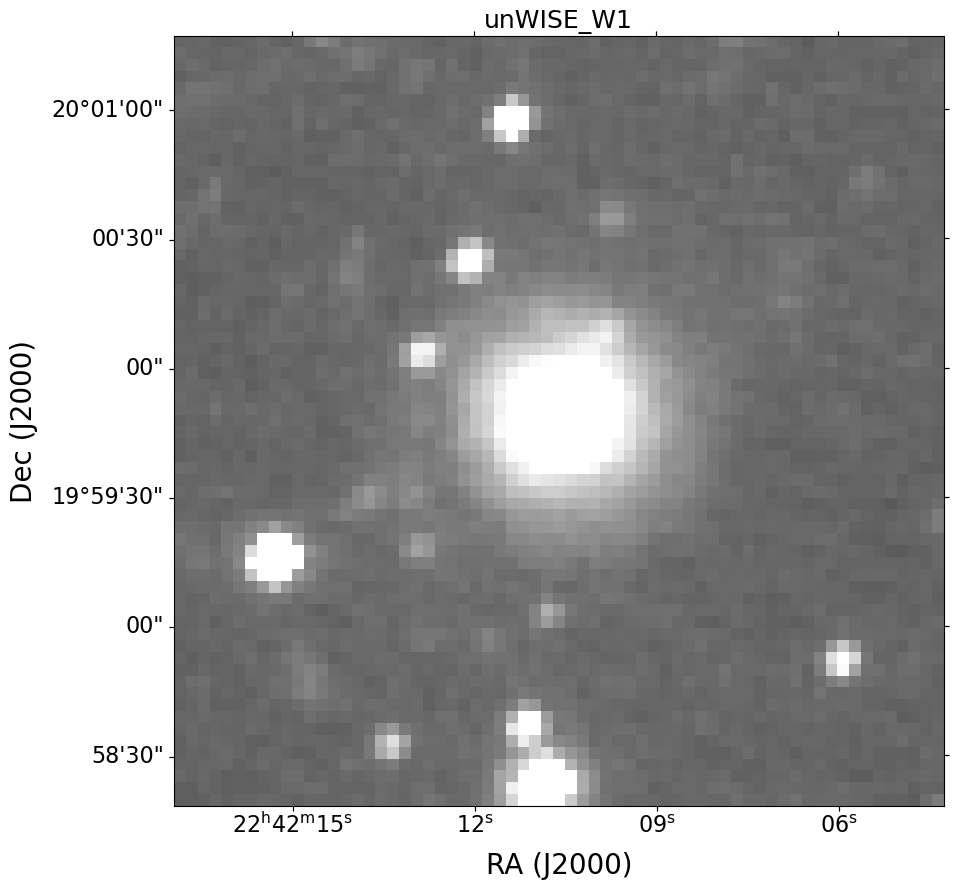

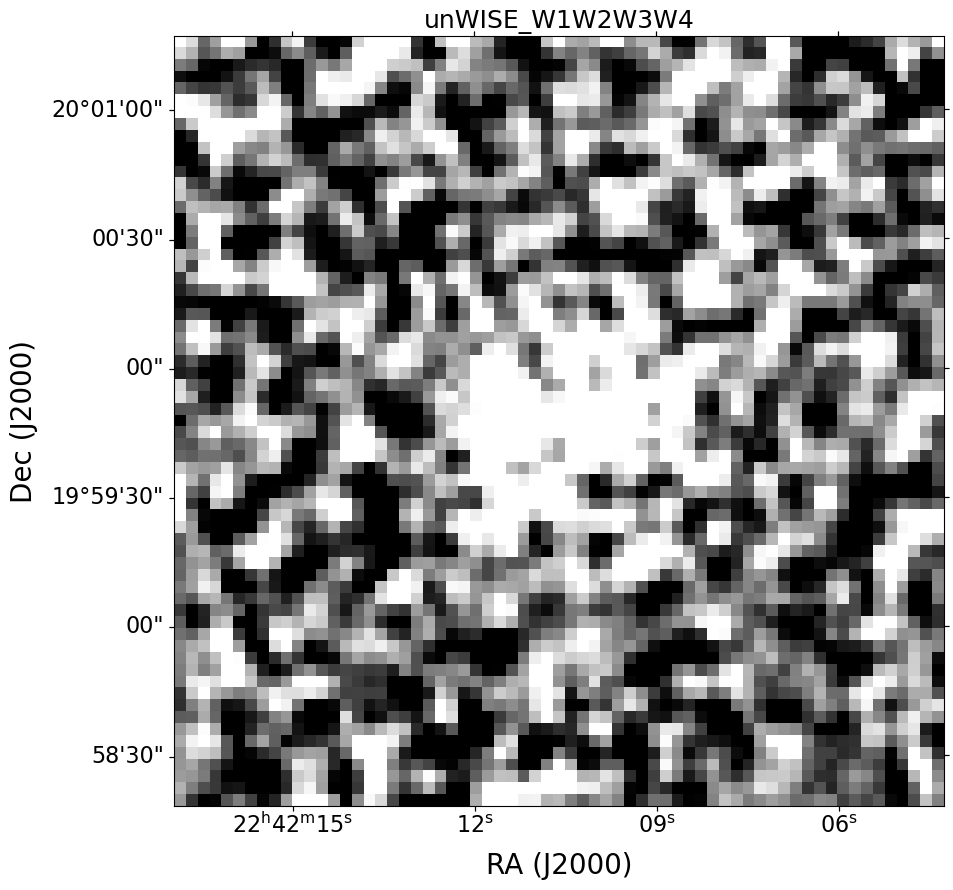

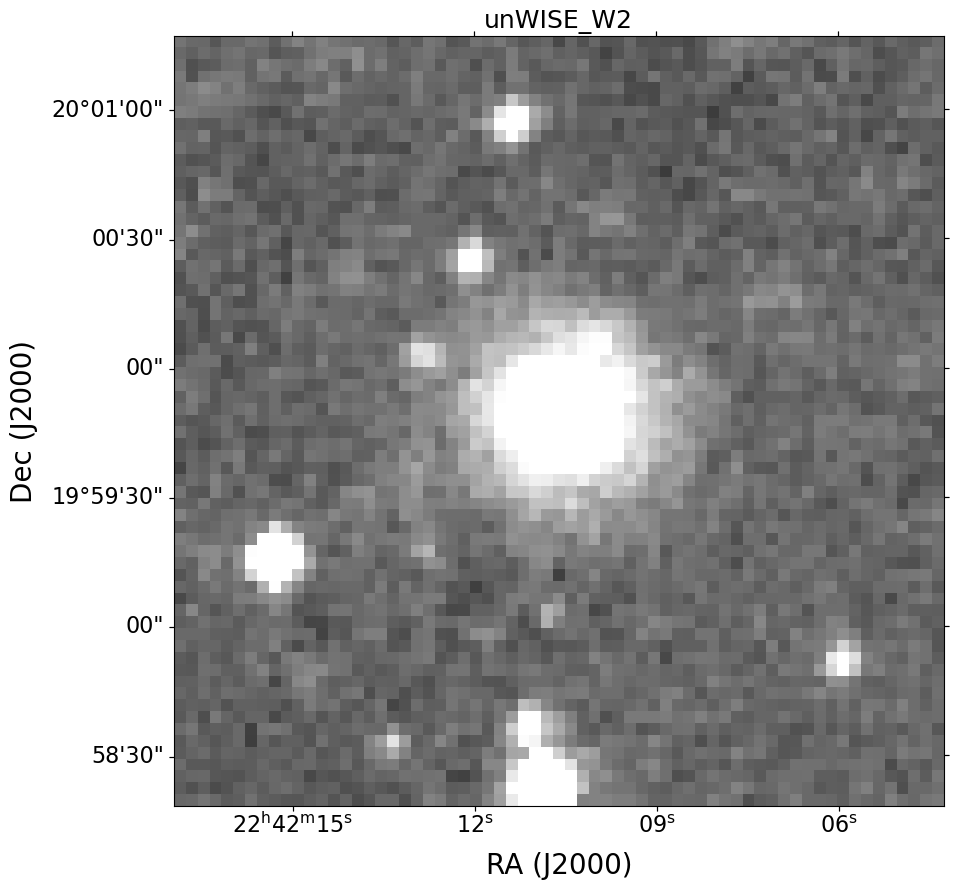

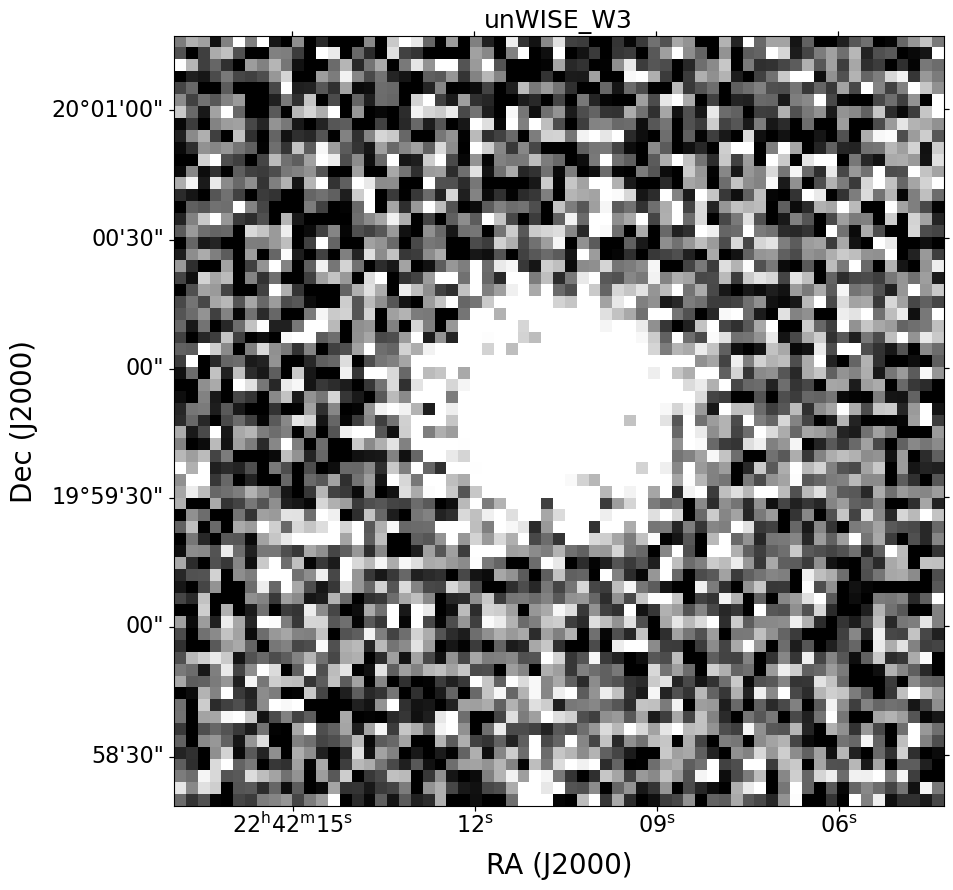

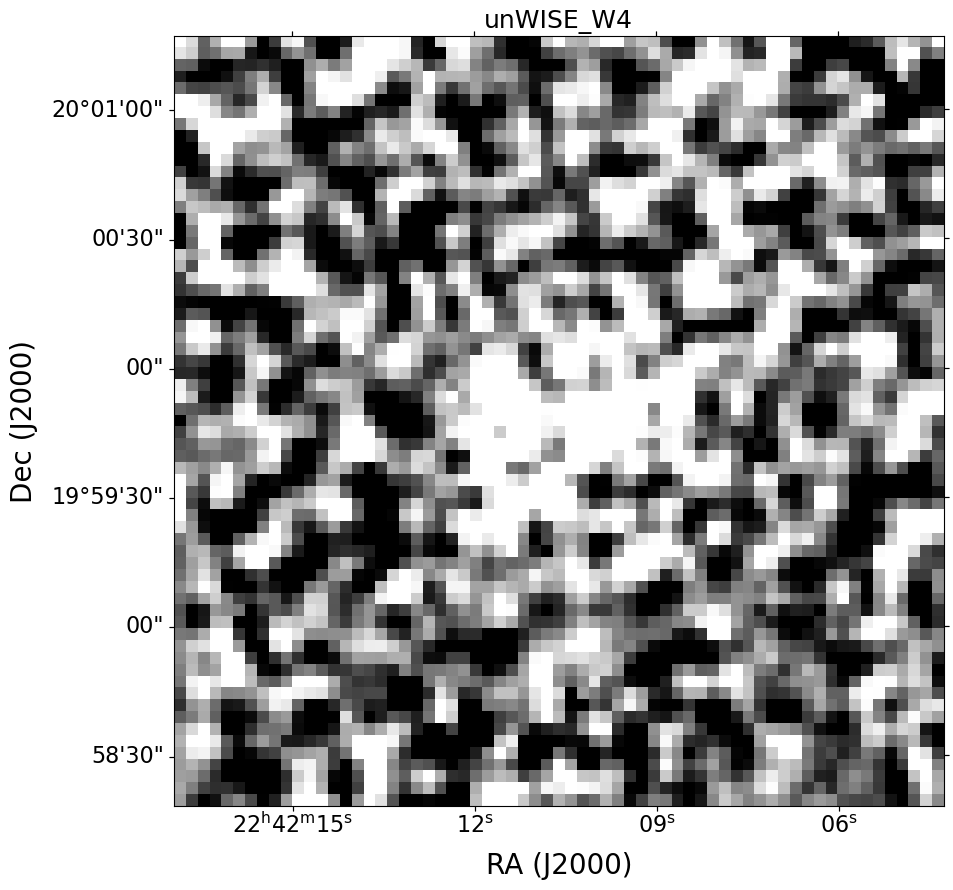

In [32]:
name = "2004ef"
survey = "unWISE"
masked_files = []

survey_files = glob.glob(f'images/{name}/{survey}*')
for file in survey_files:
    if survey in file and file.endswith('.fits'):
        masked_files.append(file)

masked_files = list(np.sort(masked_files))
for file in masked_files:
    plot_fits(file)